<h2 style="color:#37a2ff">MACHINE LEARNING MODEL TO PREDICT WHETHER THE INSURANCE CLAIM IF FRAUDULENT OR NOT ?</h2>

<p style="font-size:140%; color:#259451">Importing the necessary libraries ⤵️</p>

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import plotly.express as px

In [2]:
import matplotlib.pyplot as plt
%matplotlib inline

<p style="font-size:140%; color:#cb46ff">Importing the dataset ⤵️</p>

In [3]:
df = pd.read_csv('Automobile_insurance_fraud.csv', header=None)
df

,0,1,2,3,4,5,6,7,8,9,...,29,30,31,32,33,34,35,36,37,38
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,0,?,5070,780,780,3510,Mercedes,E400,2007,Y
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,1,NO,6500,1300,650,4550,Accura,RSX,2009,N
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,...,1,?,87200,17440,8720,61040,Honda,Accord,2006,N
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,...,3,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,...,3,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,...,1,YES,46980,5220,5220,36540,Audi,A5,1998,N


In [4]:
df.columns = ['months_as_customer', 'age', 'policy_number', 'policy_bind_date',
       'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported']


In [5]:
df

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,0,?,5070,780,780,3510,Mercedes,E400,2007,Y
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,1,NO,6500,1300,650,4550,Accura,RSX,2009,N
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,...,1,?,87200,17440,8720,61040,Honda,Accord,2006,N
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,...,3,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,...,3,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,...,1,YES,46980,5220,5220,36540,Audi,A5,1998,N


In [6]:
pd.set_option('display.max_columns', 500)

In [7]:
df

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,MALE,MD,craft-repair,sleeping,husband,53300,0,25-01-2015,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,9935 4th Drive,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,21-01-2015,Vehicle Theft,?,Minor Damage,Police,VA,Riverwood,6608 MLK Hwy,8,1,?,0,0,?,5070,780,780,3510,Mercedes,E400,2007,Y
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,sales,board-games,own-child,35100,0,22-02-2015,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7121 Francis Lane,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,10-01-2015,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,6956 Maple Drive,5,1,?,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,sales,board-games,unmarried,66000,-46000,17-02-2015,Vehicle Theft,?,Minor Damage,NaN,NY,Arlington,3041 3rd Ave,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,FEMALE,Masters,craft-repair,paintball,unmarried,0,0,22-02-2015,Single Vehicle Collision,Front Collision,Minor Damage,Fire,NC,Northbrook,6045 Andromedia St,20,1,YES,0,1,?,87200,17440,8720,61040,Honda,Accord,2006,N
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,FEMALE,PhD,prof-specialty,sleeping,wife,70900,0,24-01-2015,Single Vehicle Collision,Rear Collision,Major Damage,Fire,SC,Northbend,3092 Texas Drive,23,1,YES,2,3,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,FEMALE,Masters,armed-forces,bungie-jumping,other-relative,35100,0,23-01-2015,Multi-vehicle Collision,Side Collision,Minor Damage,Police,NC,Arlington,7629 5th St,4,3,?,2,3,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,MALE,Associate,handlers-cleaners,base-jumping,wife,0,0,26-02-2015,Single Vehicle Collision,Rear Collision,Major Damage,Other,NY,Arlington,6128 Elm Lane,2,1,?,0,1,YES,46980,5220,5220,36540,Audi,A5,1998,N


<h2 style="color:#ce922a">EXPLORATORY DATA ANALYSIS ⤵️</h2>

In [8]:
df.head()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,MALE,MD,craft-repair,sleeping,husband,53300,0,25-01-2015,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,9935 4th Drive,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,21-01-2015,Vehicle Theft,?,Minor Damage,Police,VA,Riverwood,6608 MLK Hwy,8,1,?,0,0,?,5070,780,780,3510,Mercedes,E400,2007,Y
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,sales,board-games,own-child,35100,0,22-02-2015,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7121 Francis Lane,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,10-01-2015,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,6956 Maple Drive,5,1,?,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,sales,board-games,unmarried,66000,-46000,17-02-2015,Vehicle Theft,?,Minor Damage,NaN,NY,Arlington,3041 3rd Ave,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N


In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 39 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

In [10]:
df.describe()

,months_as_customer,age,policy_number,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000
mean,203.954000,38.948000,546238.648000,1136.000000,1256.406150,1.101000e+06,501214.488000,25126.100000,-26793.700000,11.644000,1.83900,0.992000,1.487000,52761.94000,7433.420000,7399.570000,37928.950000,2005.103000
std,115.113174,9.140287,257063.005276,611.864673,244.167395,2.297407e+06,71701.610941,27872.187708,28104.096686,6.951373,1.01888,0.820127,1.111335,26401.53319,4880.951853,4824.726179,18886.252893,6.015861
min,0.000000,19.000000,100804.000000,500.000000,433.330000,-1.000000e+06,430104.000000,0.000000,-111100.000000,0.000000,1.00000,0.000000,0.000000,100.00000,0.000000,0.000000,70.000000,1995.000000
25%,115.750000,32.000000,335980.250000,500.000000,1089.607500,0.000000e+00,448404.500000,0.000000,-51500.000000,6.000000,1.00000,0.000000,1.000000,41812.50000,4295.000000,4445.000000,30292.500000,2000.000000
50%,199.500000,38.000000,533135.000000,1000.000000,1257.200000,0.000000e+00,466445.500000,0.000000,-23250.000000,12.000000,1.00000,1.000000,1.000000,58055.00000,6775.000000,6750.000000,42100.000000,2005.000000
75%,276.250000,44.000000,759099.750000,2000.000000,1415.695000,0.000000e+00,603251.000000,51025.000000,0.000000,17.000000,3.00000,2.000000,2.000000,70592.50000,11305.000000,10885.000000,50822.500000,2010.000000
max,479.000000,64.000000,999435.000000,2000.000000,2047.590000,1.000000e+07,620962.000000,100500.000000,0.000000,23.000000,4.00000,2.000000,3.000000,114920.00000,21450.000000,23670.000000,79560.000000,2015.000000


In [11]:
#Checking null values

In [12]:
df.isnull().sum()

months_as_customer              0
age                             0
policy_number                   0
policy_bind_date                0
policy_state                    0
policy_csl                      0
policy_deductable               0
policy_annual_premium           0
umbrella_limit                  0
insured_zip                     0
insured_sex                     0
insured_education_level         0
insured_occupation              0
insured_hobbies                 0
insured_relationship            0
capital-gains                   0
capital-loss                    0
incident_date                   0
incident_type                   0
collision_type                  0
incident_severity               0
authorities_contacted          91
incident_state                  0
incident_city                   0
incident_location               0
incident_hour_of_the_day        0
number_of_vehicles_involved     0
property_damage                 0
bodily_injuries                 0
witnesses     

In [13]:
df.iloc[999]

months_as_customer                             456
age                                             60
policy_number                               556080
policy_bind_date                        11-11-1996
policy_state                                    OH
policy_csl                                 250/500
policy_deductable                             1000
policy_annual_premium                       766.19
umbrella_limit                                   0
insured_zip                                 612260
insured_sex                                 FEMALE
insured_education_level                  Associate
insured_occupation                           sales
insured_hobbies                           kayaking
insured_relationship                       husband
capital-gains                                    0
capital-loss                                     0
incident_date                           26-02-2015
incident_type                           Parked Car
collision_type                 

In [14]:
df.iloc[999]['police_report_available']

'?'

<p style="font-size:140%;color:#259451">We can see that there are some null values in authorities contacted however that's not all, there are some "?" null values as well.</p>

In [15]:
df.duplicated()

0      False
1      False
2      False
3      False
4      False
       ...  
995    False
996    False
997    False
998    False
999    False
Length: 1000, dtype: bool

In [16]:
df.duplicated().sum()

0

<p style="font-size:140%;color:#ff2163">There are no duplicate samples in the dataset.</p>

In [17]:
import missingno

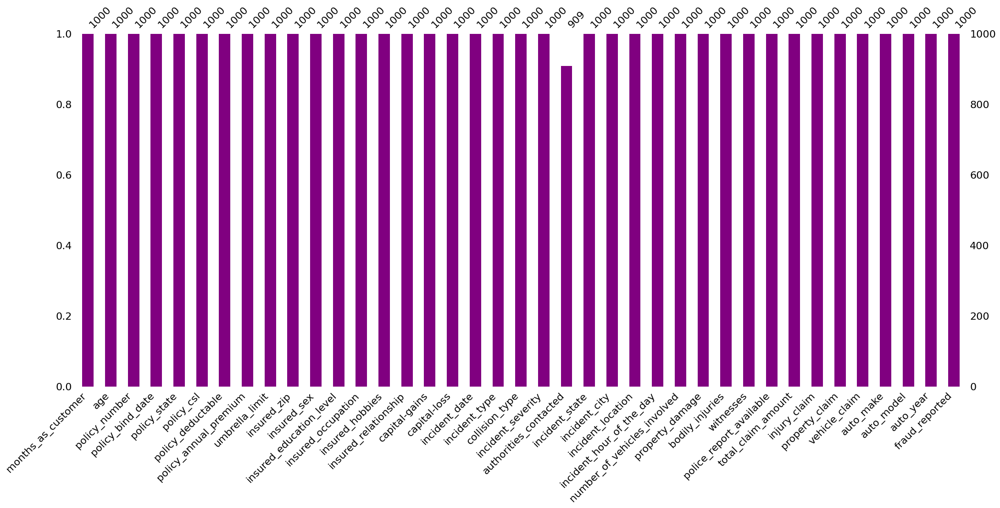

In [18]:
missingno.bar(df, color="purple")
plt.show()

In [19]:
df.skew(numeric_only=True)

months_as_customer             0.362177
age                            0.478988
policy_number                  0.038991
policy_deductable              0.477887
policy_annual_premium          0.004402
umbrella_limit                 1.806712
insured_zip                    0.816554
capital-gains                  0.478850
capital-loss                  -0.391472
incident_hour_of_the_day      -0.035584
number_of_vehicles_involved    0.502664
bodily_injuries                0.014777
witnesses                      0.019636
total_claim_amount            -0.594582
injury_claim                   0.264811
property_claim                 0.378169
vehicle_claim                 -0.621098
auto_year                     -0.048289
dtype: float64

<hr>

<h2 style="color:#8953c6">REPLACING "?" VALUES ⤵️</h2>

In [20]:
df.replace(to_replace="?", value=np.nan, inplace=True)
df

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,MALE,MD,craft-repair,sleeping,husband,53300,0,25-01-2015,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,9935 4th Drive,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,21-01-2015,Vehicle Theft,NaN,Minor Damage,Police,VA,Riverwood,6608 MLK Hwy,8,1,NaN,0,0,NaN,5070,780,780,3510,Mercedes,E400,2007,Y
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,sales,board-games,own-child,35100,0,22-02-2015,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7121 Francis Lane,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,10-01-2015,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,6956 Maple Drive,5,1,NaN,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,sales,board-games,unmarried,66000,-46000,17-02-2015,Vehicle Theft,NaN,Minor Damage,NaN,NY,Arlington,3041 3rd Ave,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,FEMALE,Masters,craft-repair,paintball,unmarried,0,0,22-02-2015,Single Vehicle Collision,Front Collision,Minor Damage,Fire,NC,Northbrook,6045 Andromedia St,20,1,YES,0,1,NaN,87200,17440,8720,61040,Honda,Accord,2006,N
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,FEMALE,PhD,prof-specialty,sleeping,wife,70900,0,24-01-2015,Single Vehicle Collision,Rear Collision,Major Damage,Fire,SC,Northbend,3092 Texas Drive,23,1,YES,2,3,NaN,108480,18080,18080,72320,Volkswagen,Passat,2015,N
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,FEMALE,Masters,armed-forces,bungie-jumping,other-relative,35100,0,23-01-2015,Multi-vehicle Collision,Side Collision,Minor Damage,Police,NC,Arlington,7629 5th St,4,3,NaN,2,3,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,MALE,Associate,handlers-cleaners,base-jumping,wife,0,0,26-02-2015,Single Vehicle Collision,Rear Collision,Major Damage,Other,NY,Arlington,6128 Elm Lane,2,1,NaN,0,1,YES,46980,5220,5220,36540,Audi,A5,1998,N


<p style="font-size:140%;color:#182883">You see now we will be able to see all null values very easily.</p>

In [21]:
df.isnull().sum()

months_as_customer               0
age                              0
policy_number                    0
policy_bind_date                 0
policy_state                     0
policy_csl                       0
policy_deductable                0
policy_annual_premium            0
umbrella_limit                   0
insured_zip                      0
insured_sex                      0
insured_education_level          0
insured_occupation               0
insured_hobbies                  0
insured_relationship             0
capital-gains                    0
capital-loss                     0
incident_date                    0
incident_type                    0
collision_type                 178
incident_severity                0
authorities_contacted           91
incident_state                   0
incident_city                    0
incident_location                0
incident_hour_of_the_day         0
number_of_vehicles_involved      0
property_damage                360
bodily_injuries     

In [22]:
df.isnull().sum().sum()

972

<p style="font-size:140%;color:#1b7583">There are 972 total null values in our dataset. We will fill these values with mean and mode values as per the situation.</p>

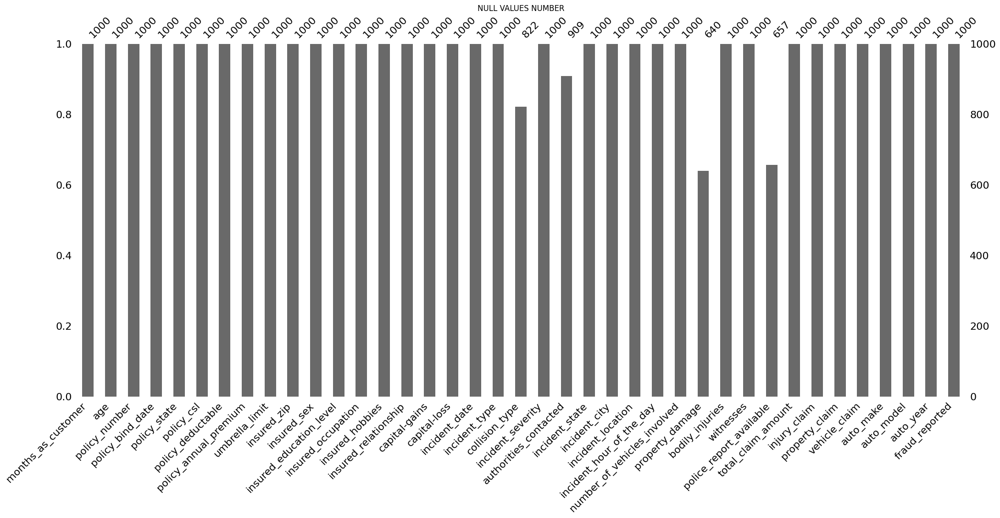

In [23]:
missingno.bar(df)
plt.title('NULL VALUES NUMBER')
plt.show()


<hr><hr>

<h2 style="color:#f79113">DATA VISUALIZATION ⤵️</h2>

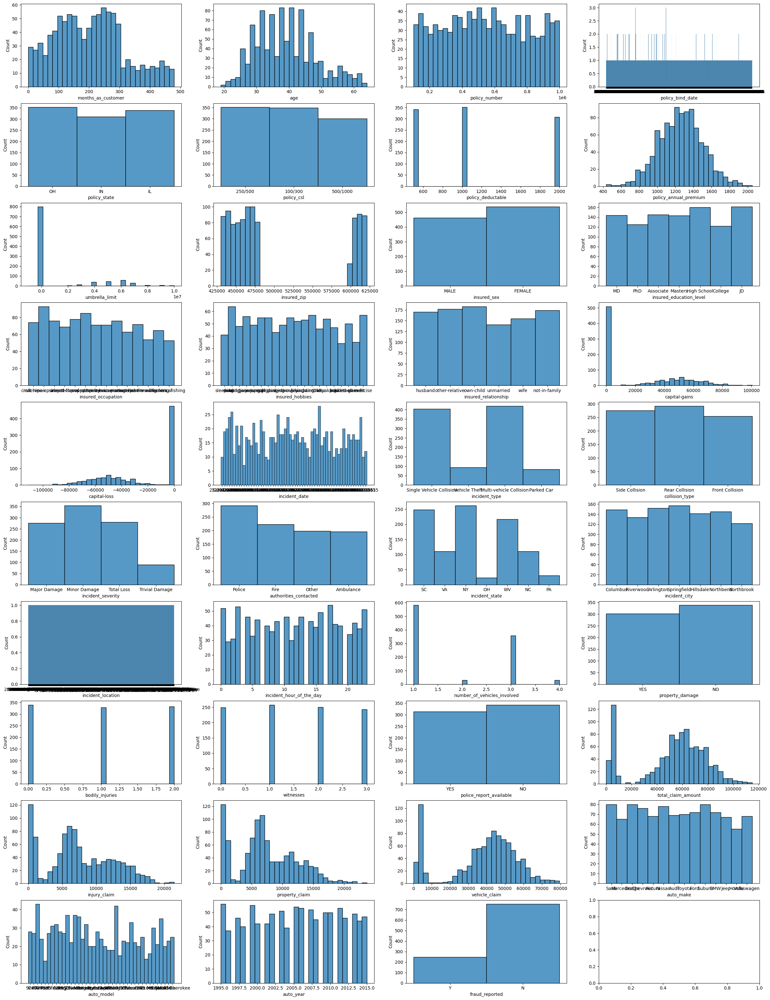

In [24]:
fig, axes = plt.subplots(10,4, figsize=(30,40))
plotnumber = 1
for x in df.columns:
    ax = plt.subplot(10,4, plotnumber)
    sns.histplot(data=df, x=x, bins=30)
    plotnumber+=1

In [25]:
num_cols = []
for x in df.columns:
    if df[x].dtype!='object':
        print(x)
        num_cols.append(x)

months_as_customer
age
policy_number
policy_deductable
policy_annual_premium
umbrella_limit
insured_zip
capital-gains
capital-loss
incident_hour_of_the_day
number_of_vehicles_involved
bodily_injuries
witnesses
total_claim_amount
injury_claim
property_claim
vehicle_claim
auto_year


In [26]:
cat_cols = []
for x in df.columns:
    if df[x].dtype=='object':
        print(x)
        cat_cols.append(x)

policy_bind_date
policy_state
policy_csl
insured_sex
insured_education_level
insured_occupation
insured_hobbies
insured_relationship
incident_date
incident_type
collision_type
incident_severity
authorities_contacted
incident_state
incident_city
incident_location
property_damage
police_report_available
auto_make
auto_model
fraud_reported


In [27]:
print(f'The number of numerical columns is {len(num_cols)}')
print(f'The number of categorical columns is {len(cat_cols)}')

The number of numerical columns is 18
The number of categorical columns is 21


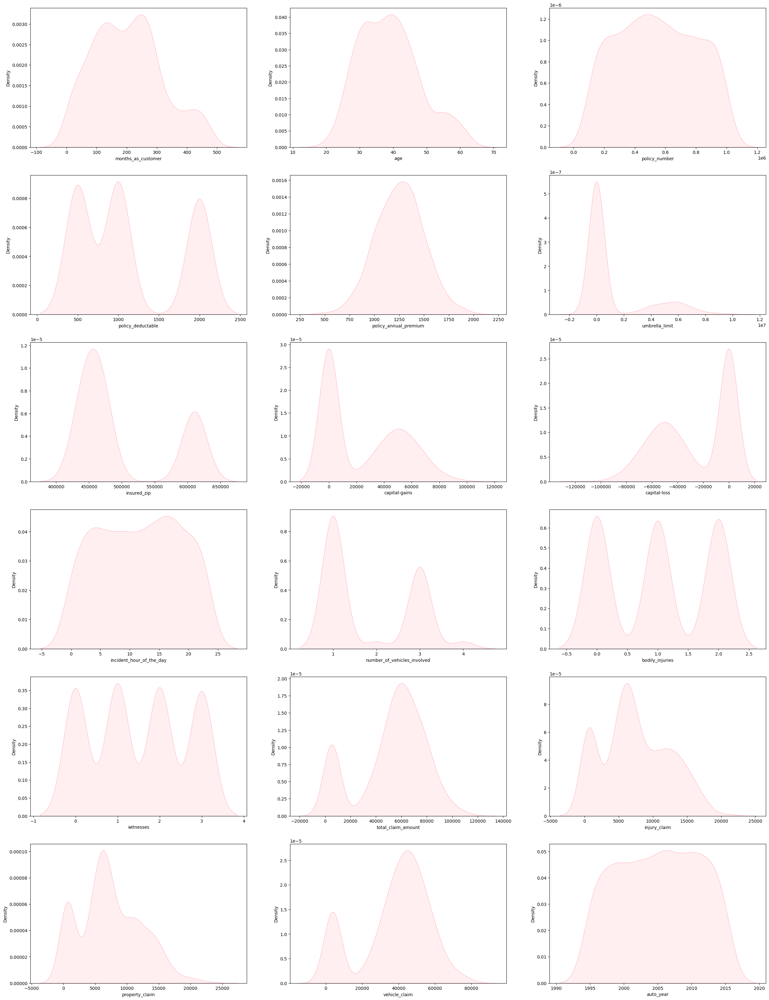

In [28]:
fig, axes = plt.subplots(6,3, figsize=(30,40))
plotnumber = 1
for x in num_cols:
    ax = plt.subplot(6,3, plotnumber)
    sns.kdeplot(data=df, x=x, fill=True, color="pink")
    plotnumber+=1

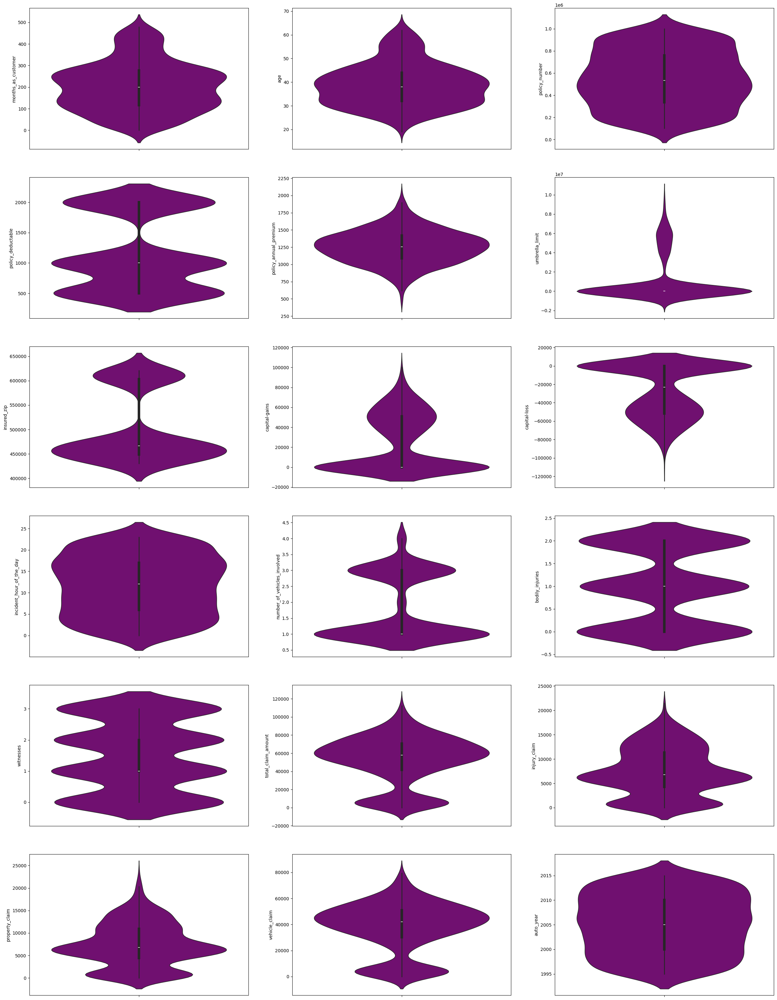

In [29]:
fig, axes = plt.subplots(6,3, figsize=(30,40))
plotnumber = 1
for x in num_cols:
    ax = plt.subplot(6,3, plotnumber)
    sns.violinplot(data=df, y=x, color="purple")
    plotnumber+=1

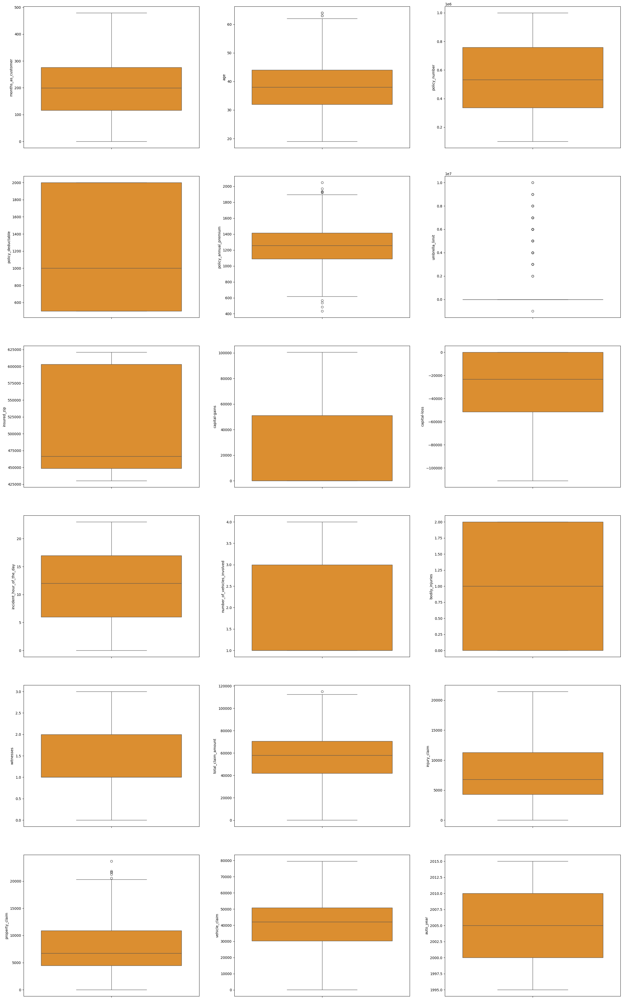

In [30]:
fig, axes = plt.subplots(6,3, figsize=(30,50))
plotnumber = 1
for x in num_cols:
    ax = plt.subplot(6,3, plotnumber)
    sns.boxplot(data=df, y=x, color='#f79113')
    plotnumber+=1

In [31]:
df.corr(numeric_only=True)

,months_as_customer,age,policy_number,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year
months_as_customer,1.000000,0.922098,0.057555,0.026807,0.005018,0.015498,0.017895,0.006399,0.020209,0.070639,0.014736,-0.010162,0.058383,0.062108,0.065329,0.034940,0.061013,-0.000292
age,0.922098,1.000000,0.059413,0.029188,0.014404,0.018126,0.025604,-0.007075,0.007368,0.087161,0.022102,-0.015679,0.052359,0.069863,0.075522,0.060898,0.062588,0.001354
policy_number,0.057555,0.059413,1.000000,-0.006738,0.022566,0.008968,0.007083,0.009802,-0.005669,0.000113,0.013432,-0.004558,-0.012661,-0.018009,-0.008762,-0.010678,-0.020184,-0.000183
policy_deductable,0.026807,0.029188,-0.006738,1.000000,-0.003245,0.010870,0.004545,0.035212,-0.023544,0.060935,0.051214,-0.022765,0.066639,0.022839,0.039107,0.064792,0.005269,0.026105
policy_annual_premium,0.005018,0.014404,0.022566,-0.003245,1.000000,-0.006247,0.032354,-0.013738,0.023547,-0.001578,-0.045991,0.026780,0.002332,0.009094,-0.017633,-0.011654,0.020246,-0.049226
umbrella_limit,0.015498,0.018126,0.008968,0.010870,-0.006247,1.000000,0.019671,-0.047268,-0.024056,-0.023257,-0.021270,0.022743,-0.006738,-0.040344,-0.045412,-0.023790,-0.038584,0.009893
insured_zip,0.017895,0.025604,0.007083,0.004545,0.032354,0.019671,1.000000,0.006303,0.049372,0.008274,0.027448,0.028695,0.019805,-0.033873,-0.017495,-0.006841,-0.041083,-0.032736
capital-gains,0.006399,-0.007075,0.009802,0.035212,-0.013738,-0.047268,0.006303,1.000000,-0.046904,-0.016406,0.061643,0.055829,-0.017651,0.015980,0.025934,-0.000779,0.015836,0.031398
capital-loss,0.020209,0.007368,-0.005669,-0.023544,0.023547,-0.024056,0.049372,-0.046904,1.000000,-0.025054,-0.014895,-0.024418,-0.041330,-0.036060,-0.046060,-0.022863,-0.032665,-0.056615
incident_hour_of_the_day,0.070639,0.087161,0.000113,0.060935,-0.001578,-0.023257,0.008274,-0.016406,-0.025054,1.000000,0.120794,-0.034563,0.006527,0.217702,0.165768,0.179536,0.215626,0.021368


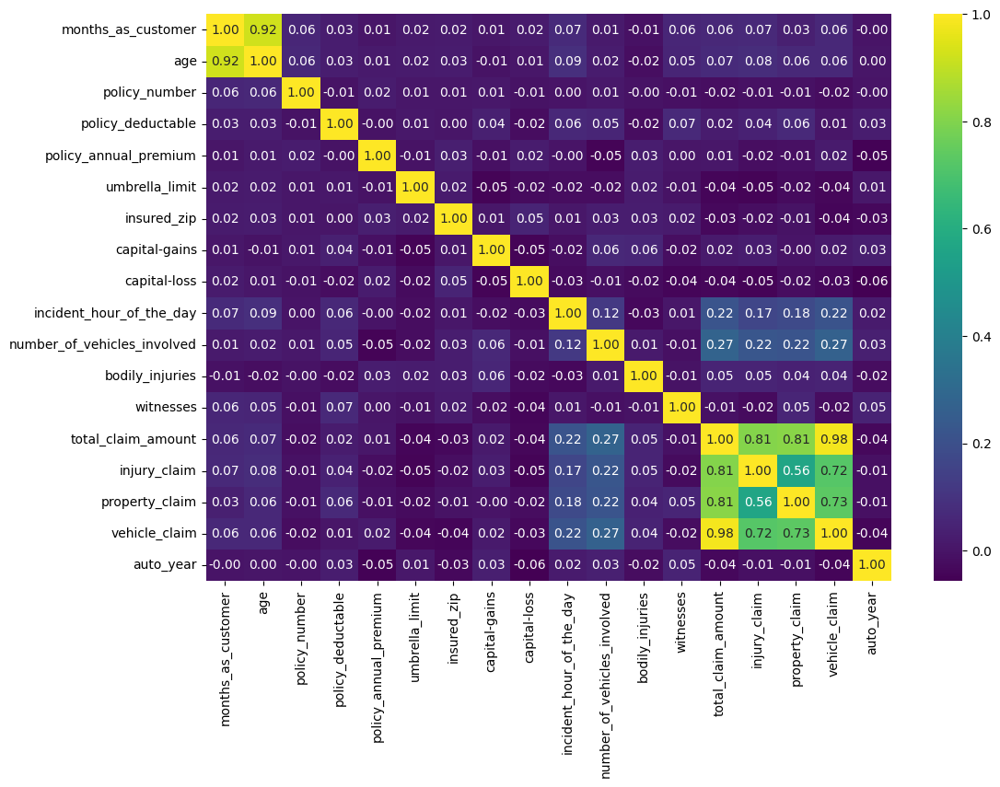

In [32]:
plt.figure(figsize=(12,8))
sns.heatmap(data=df.corr(numeric_only=True),annot=True, fmt="0.2f", cmap='viridis')
plt.show()

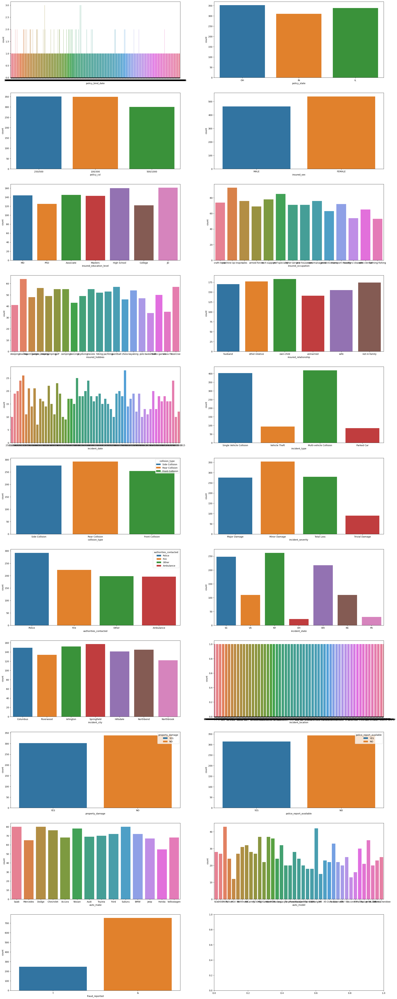

In [33]:
fig, axes = plt.subplots(11,2, figsize=(30,80))
plotnumber = 1
for x in cat_cols:
    ax = plt.subplot(11,2, plotnumber)
    sns.countplot(data=df, x=x, hue=x)
    plotnumber+=1

In [34]:
df['fraud_reported'].value_counts()

fraud_reported
N    753
Y    247
Name: count, dtype: int64

<p style="font-size:140%;color:#259451">We can see that this is an imbalanced dataset as Yes values in fraudulent columns are only 247 and no are 753. So, we will balance this later.</p>

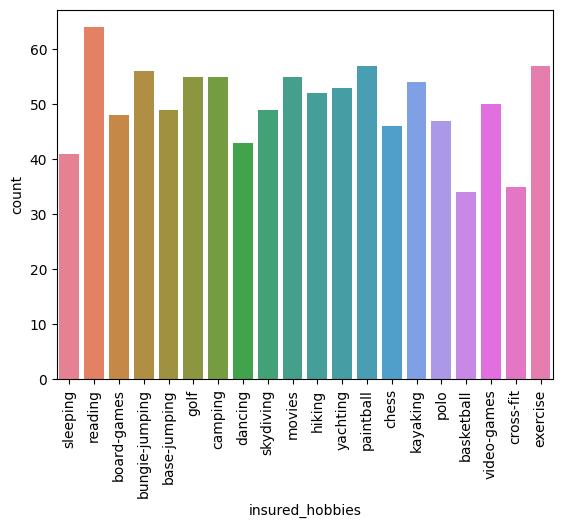

In [35]:
sns.countplot(data=df, x='insured_hobbies',hue='insured_hobbies')
plt.xticks(rotation=90)
plt.show()

In [36]:
sns.set_style('darkgrid')

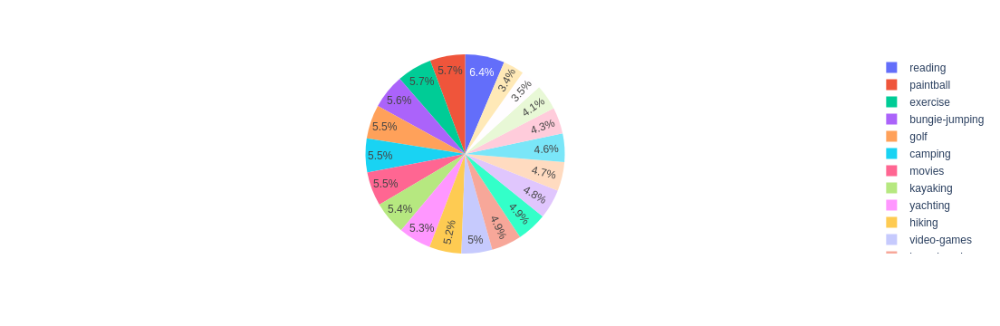

In [37]:
px.pie(data_frame=df, names='insured_hobbies')

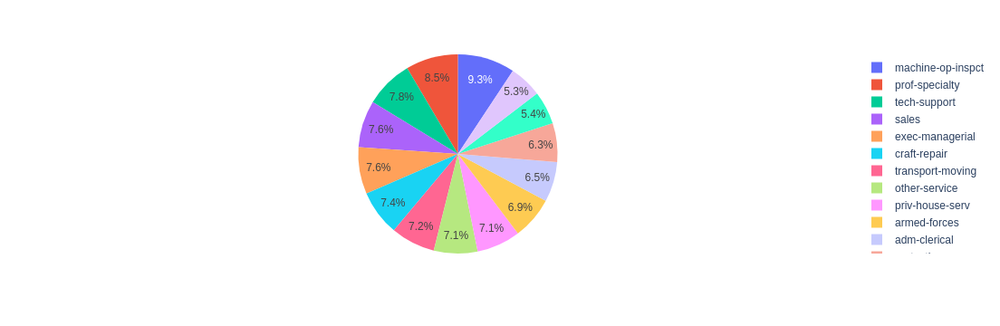

In [38]:
px.pie(data_frame=df, names='insured_occupation')

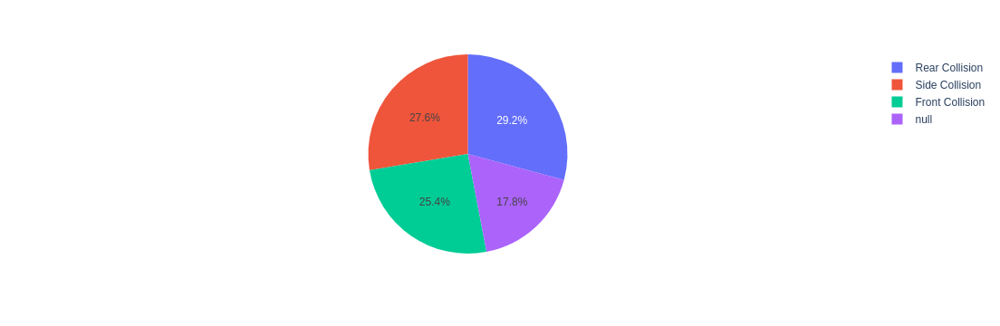

In [39]:
px.pie(data_frame=df, names='collision_type')

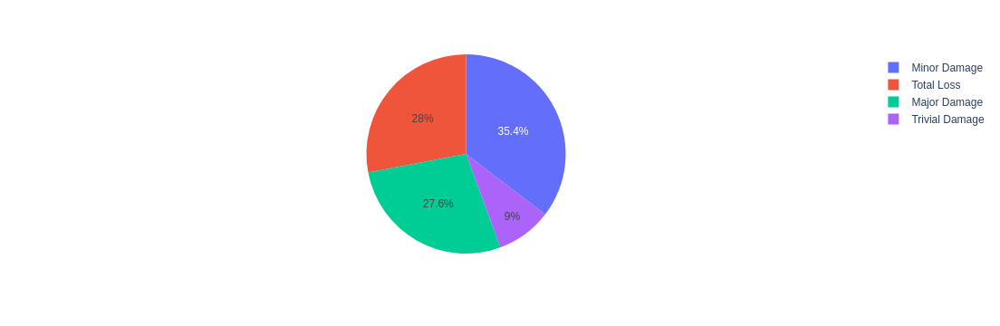

In [40]:
px.pie(data_frame=df, names='incident_severity')

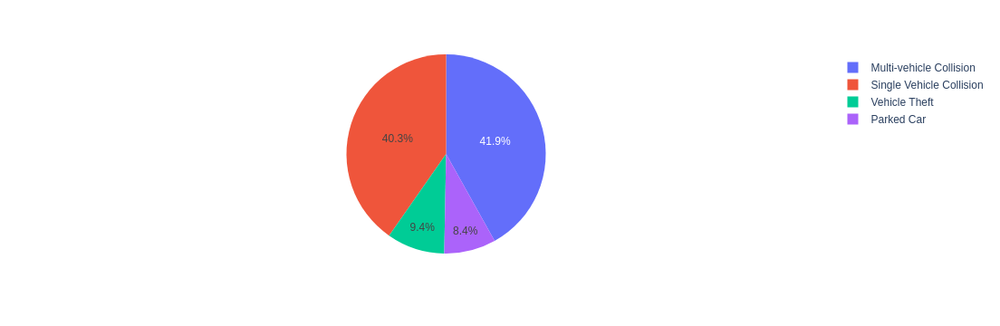

In [41]:
px.pie(data_frame=df, names='incident_type')

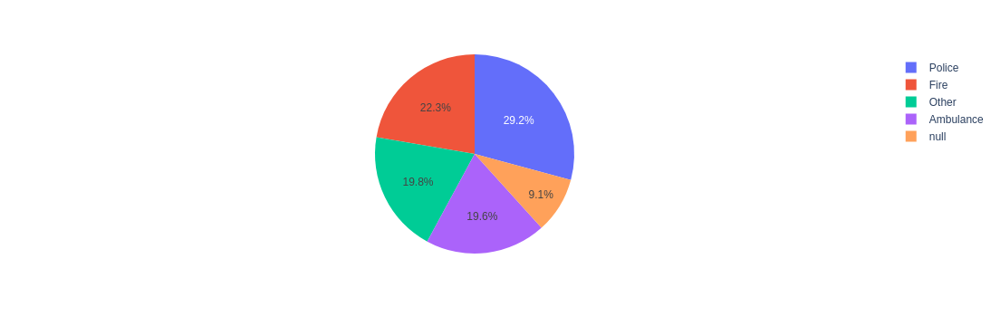

In [42]:
px.pie(data_frame=df, names='authorities_contacted')

<Axes: xlabel='total_claim_amount', ylabel='policy_annual_premium'>

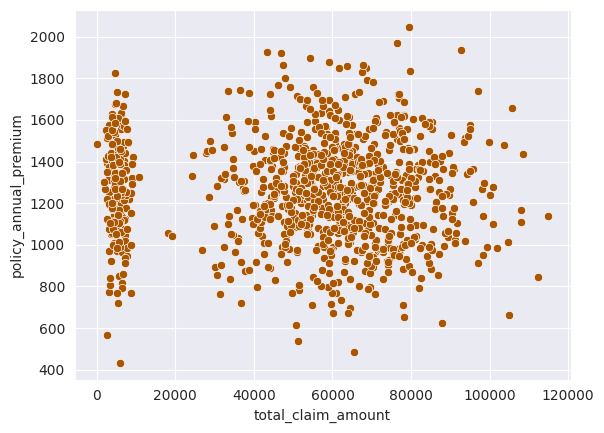

In [43]:
sns.scatterplot(data=df, x='total_claim_amount', y='policy_annual_premium', color='#aa5500')

In [44]:
#The above plot compares the amount claimed by the person and their annual policy payment.

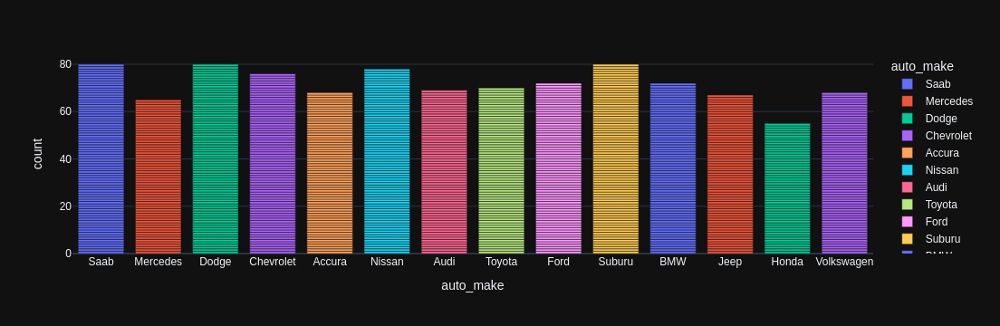

In [45]:
px.bar(data_frame=df, x='auto_make', template='plotly_dark',color='auto_make')

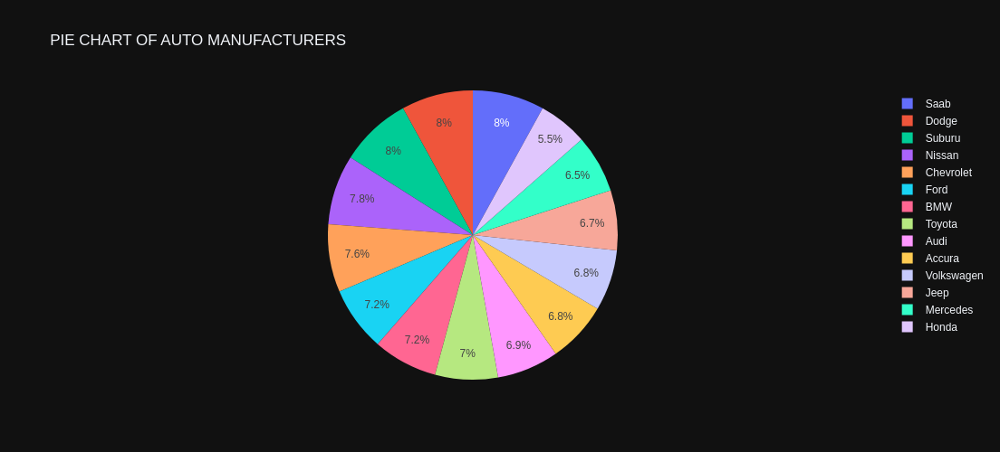

In [46]:
px.pie(data_frame=df, names='auto_make',template='plotly_dark', width=500, height=500,title='PIE CHART OF AUTO MANUFACTURERS')

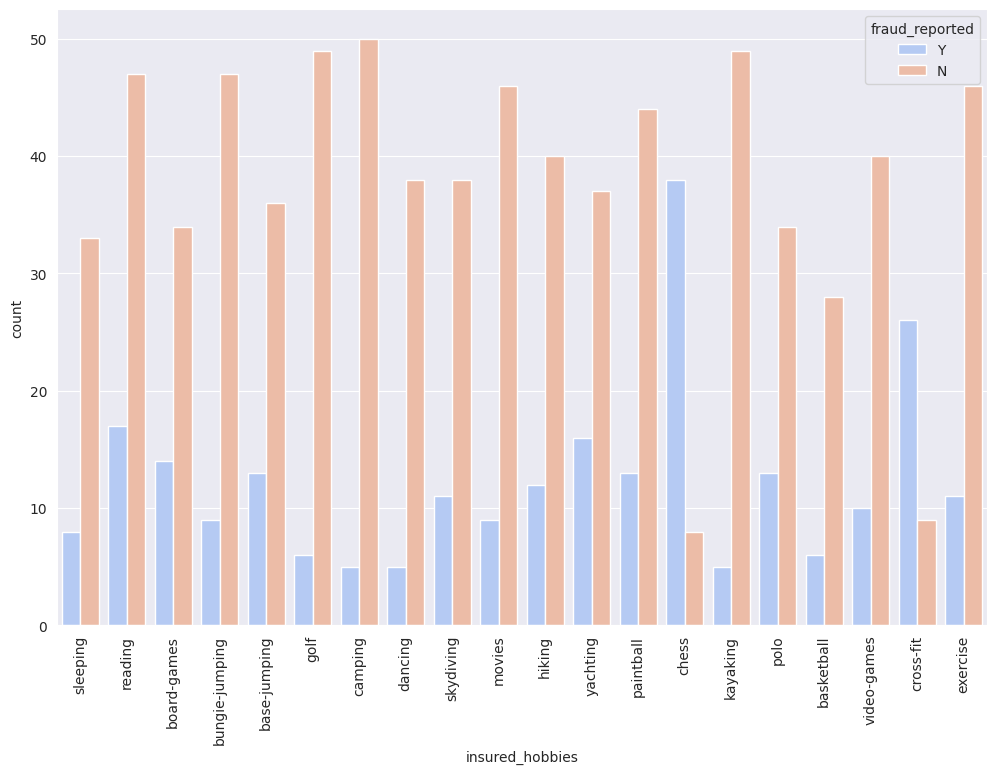

In [47]:
plt.figure(figsize=(12,8))
sns.countplot(data=df, x='insured_hobbies', hue='fraud_reported', palette='coolwarm')
plt.xticks(rotation=90)
plt.show()

In [48]:
df.groupby(by='auto_make')['total_claim_amount'].mean()

auto_make
Accura        52518.823529
Audi          54383.768116
BMW           55905.277778
Chevrolet     52746.578947
Dodge         55944.375000
Ford          56570.138889
Honda         51714.909091
Jeep          51608.805970
Mercedes      52372.153846
Nissan        51545.256410
Saab          51445.375000
Suburu        53730.125000
Toyota        46523.714286
Volkswagen    50854.852941
Name: total_claim_amount, dtype: float64

In [49]:
import warnings
warnings.filterwarnings(action='ignore')

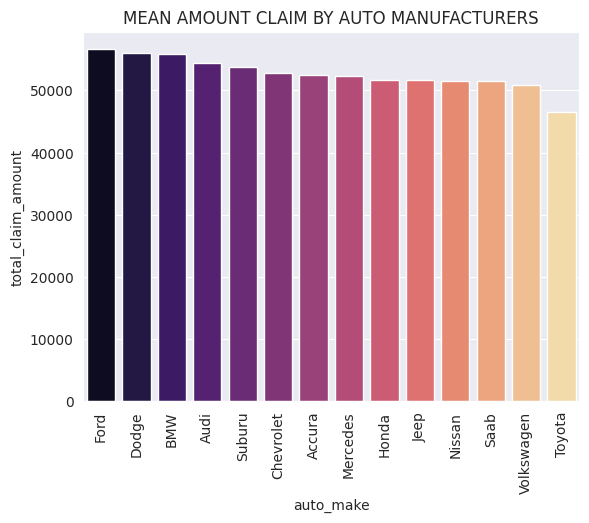

In [50]:
sns.barplot(data=df.groupby(by='auto_make')['total_claim_amount'].mean().sort_values(ascending=False), palette='magma')
plt.xticks(rotation=90)
plt.title('MEAN AMOUNT CLAIM BY AUTO MANUFACTURERS')
plt.show()

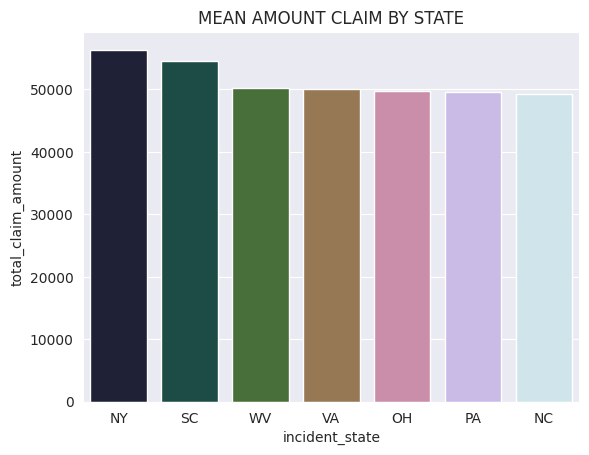

In [51]:
sns.barplot(data=df.groupby(by='incident_state')['total_claim_amount'].mean().sort_values(ascending=False), palette='cubehelix')
plt.title('MEAN AMOUNT CLAIM BY STATE')
plt.show()

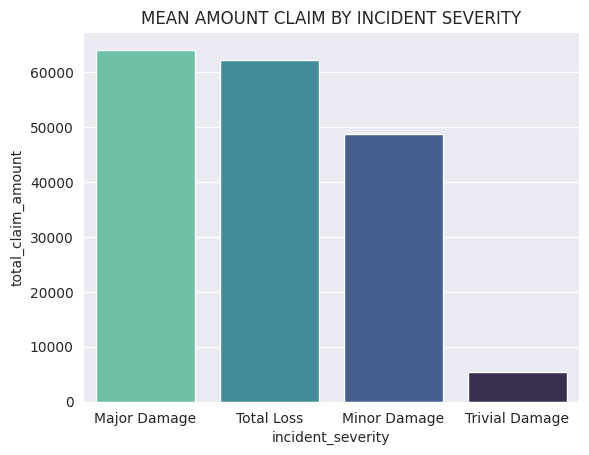

In [173]:
sns.barplot(data=df.groupby(by='incident_severity')['total_claim_amount'].mean().sort_values(ascending=False), palette='mako_r')
plt.title('MEAN AMOUNT CLAIM BY INCIDENT SEVERITY')
plt.show()

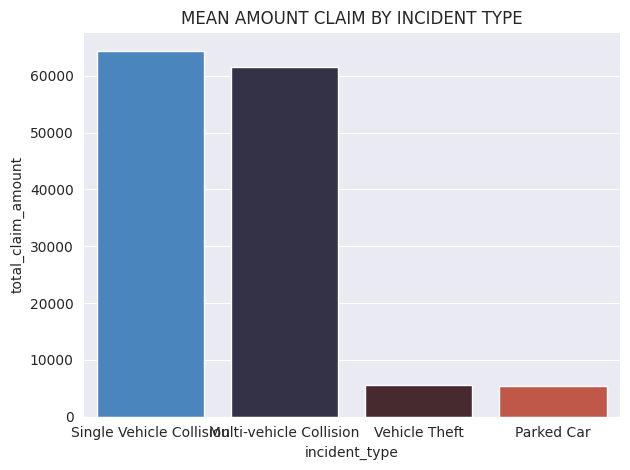

In [52]:
sns.barplot(data=df.groupby(by='incident_type')['total_claim_amount'].mean().sort_values(ascending=False), palette='icefire')
plt.title('MEAN AMOUNT CLAIM BY INCIDENT TYPE')
plt.tight_layout()
plt.show()

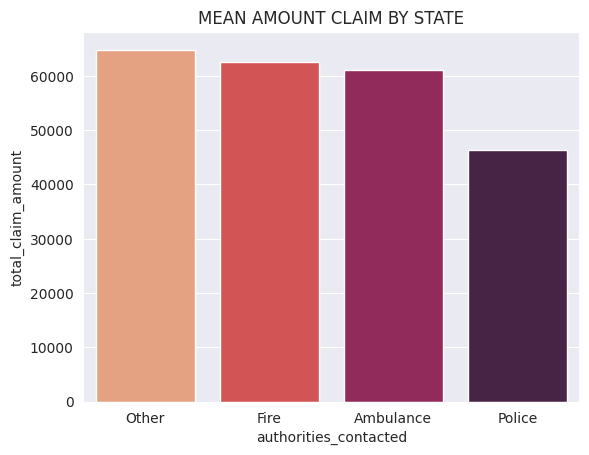

In [53]:
sns.barplot(data=df.groupby(by='authorities_contacted')['total_claim_amount'].mean().sort_values(ascending=False), palette='rocket_r')
plt.title('MEAN AMOUNT CLAIM BY STATE')
plt.show()

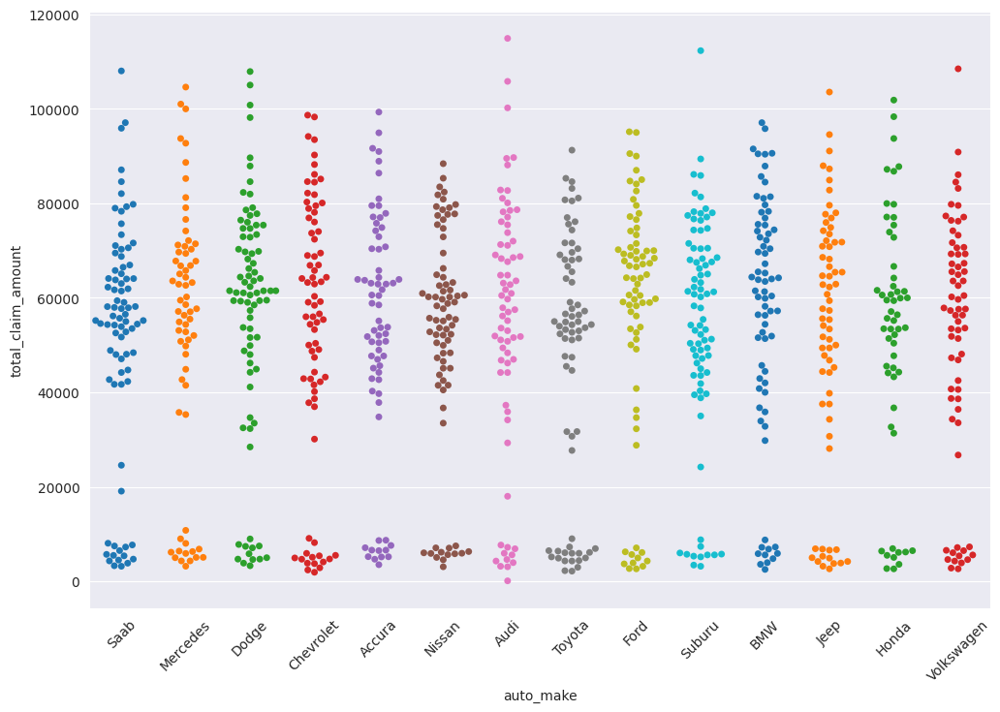

In [54]:
plt.figure(figsize=(12,8))
sns.swarmplot(data=df, x='auto_make', y='total_claim_amount', palette='tab10')
plt.xticks(rotation=45)
plt.show()

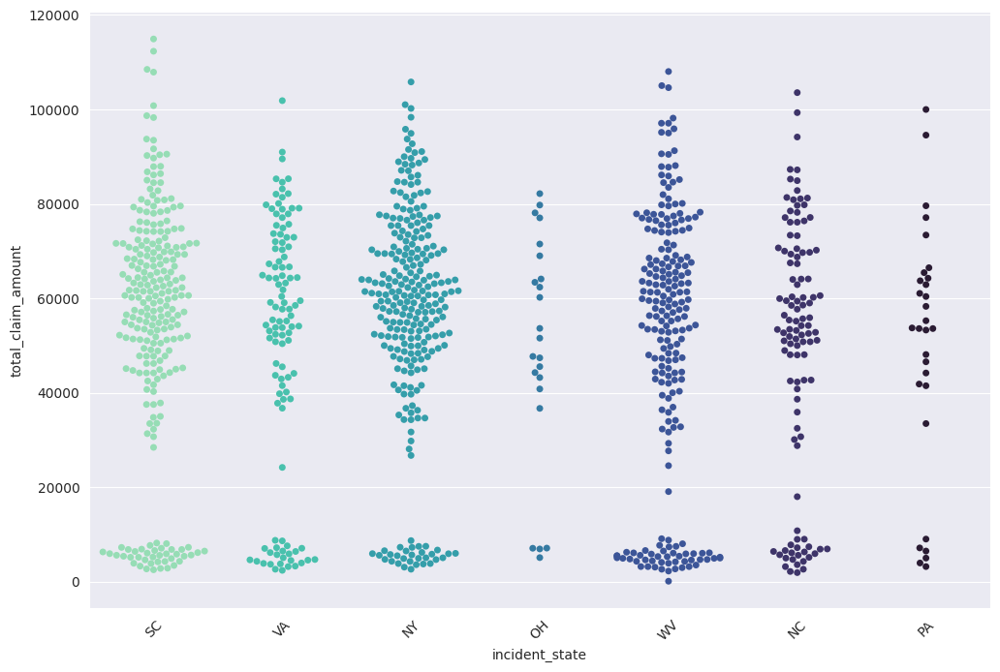

In [55]:
plt.figure(figsize=(12,8))
sns.swarmplot(data=df, x='incident_state', y='total_claim_amount', palette='mako_r')
plt.xticks(rotation=45)
plt.show()

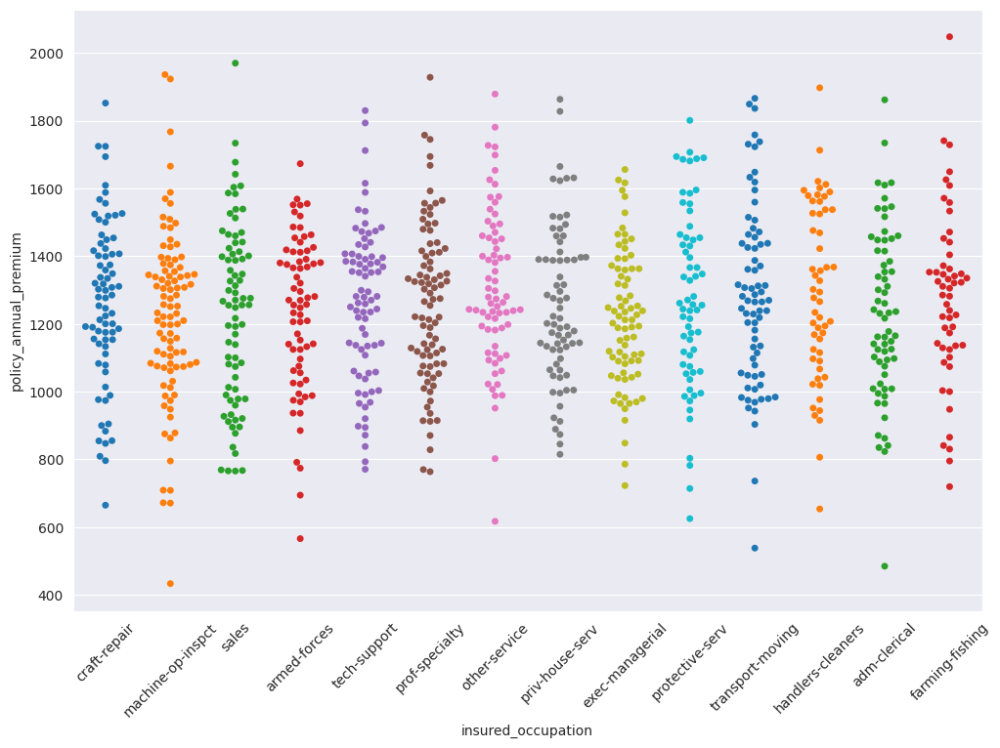

In [56]:
plt.figure(figsize=(12,8))
sns.swarmplot(data=df, x='insured_occupation', y='policy_annual_premium', palette='tab10')
plt.xticks(rotation=45)
plt.show()

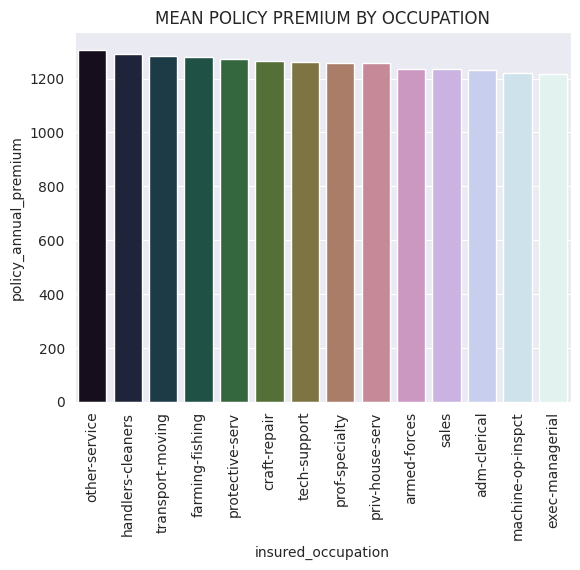

In [57]:
sns.barplot(data=df.groupby(by='insured_occupation')['policy_annual_premium'].mean().sort_values(ascending=False), palette='cubehelix')
plt.xticks(rotation=90)
plt.title('MEAN POLICY PREMIUM BY OCCUPATION')
plt.show()

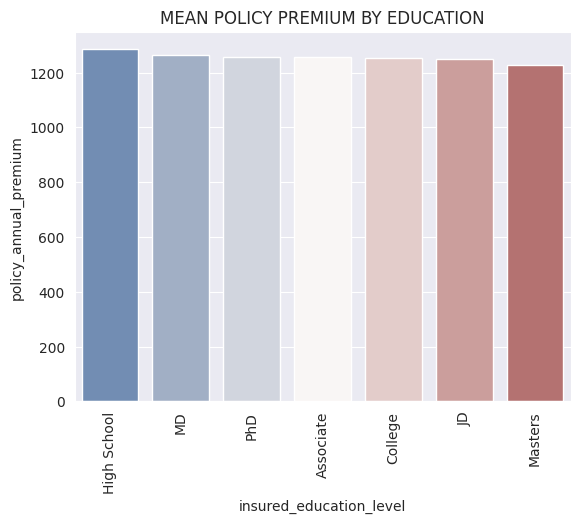

In [58]:
sns.barplot(data=df.groupby(by='insured_education_level')['policy_annual_premium'].mean().sort_values(ascending=False), palette='vlag')
plt.xticks(rotation=90)
plt.title('MEAN POLICY PREMIUM BY EDUCATION')
plt.show()

In [59]:
#ABOVE GRAPHS OFFER SOME USEFUL INSIGHTS ABOUT THE DATASET

In [60]:
#NOW, LET'S FINALLY LOOK AT CROSS TAB DATA

In [61]:
pd.crosstab(index=df['insured_sex'], columns=df['fraud_reported'])

fraud_reported,N,Y
insured_sex,,
FEMALE,411,126
MALE,342,121


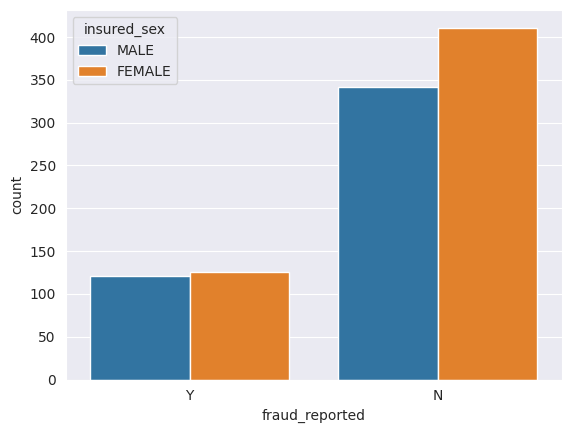

In [62]:
sns.countplot(data=df, x='fraud_reported',hue='insured_sex')
plt.show()

In [63]:
pd.crosstab(index=df['fraud_reported'], columns=df['insured_occupation'])

insured_occupation,adm-clerical,armed-forces,craft-repair,exec-managerial,farming-fishing,handlers-cleaners,machine-op-inspct,other-service,priv-house-serv,prof-specialty,protective-serv,sales,tech-support,transport-moving
fraud_reported,,,,,,,,,,,,,,
N,54,52,52,48,37,43,71,59,59,67,49,55,56,51
Y,11,17,22,28,16,11,22,12,12,18,14,21,22,21


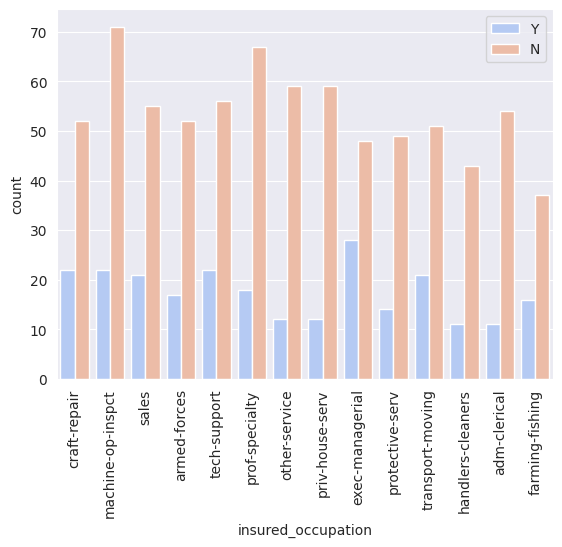

In [64]:
sns.countplot(data=df, hue='fraud_reported',x='insured_occupation',palette='coolwarm')
plt.xticks(rotation=90)
plt.legend()
plt.show()

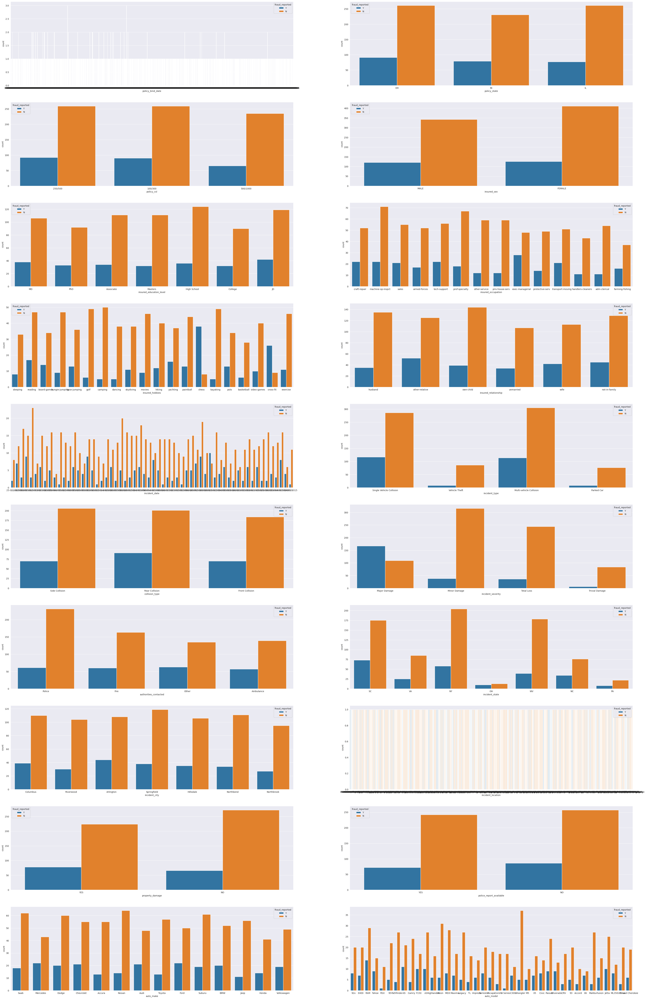

In [65]:
fig, axes = plt.subplots(10,2, figsize=(50,80))
plotnumber = 1
for x in cat_cols[:-1]:
    ax = plt.subplot(10,2, plotnumber)
    sns.countplot(data=df, x=x, hue='fraud_reported')
    plotnumber+=1

In [66]:
pd.crosstab(index=df['incident_state'], columns=df['fraud_reported'])

fraud_reported,N,Y
incident_state,,
NC,76,34
NY,204,58
OH,13,10
PA,22,8
SC,175,73
VA,85,25
WV,178,39


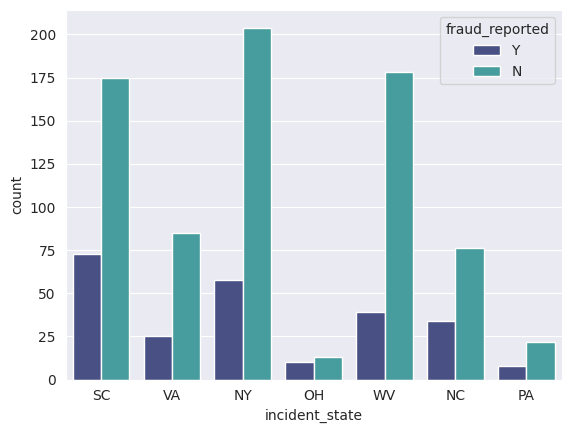

In [67]:
sns.countplot(data=df, hue='fraud_reported',x='incident_state',palette='mako')
plt.show()

In [68]:
#There are some states where most people don't get insurance claim money like SC, NY because of fraud

In [69]:
pd.crosstab(index=df['incident_severity'], columns=df['fraud_reported'])

fraud_reported,N,Y
incident_severity,,
Major Damage,109,167
Minor Damage,316,38
Total Loss,244,36
Trivial Damage,84,6


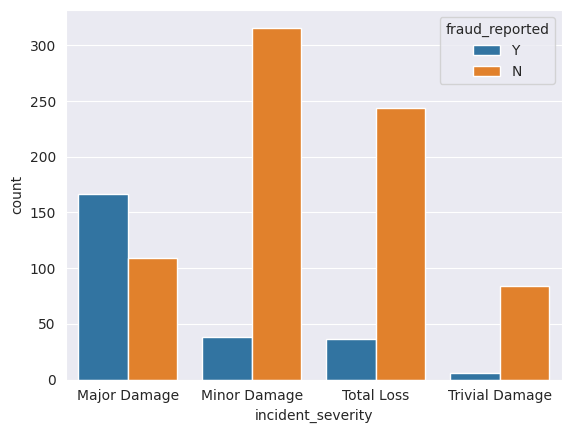

In [70]:
sns.countplot(data=df, hue='fraud_reported',x='incident_severity')
plt.show()

In [71]:
pd.crosstab(index=df['incident_type'], columns=df['fraud_reported'])

fraud_reported,N,Y
incident_type,,
Multi-vehicle Collision,305,114
Parked Car,76,8
Single Vehicle Collision,286,117
Vehicle Theft,86,8


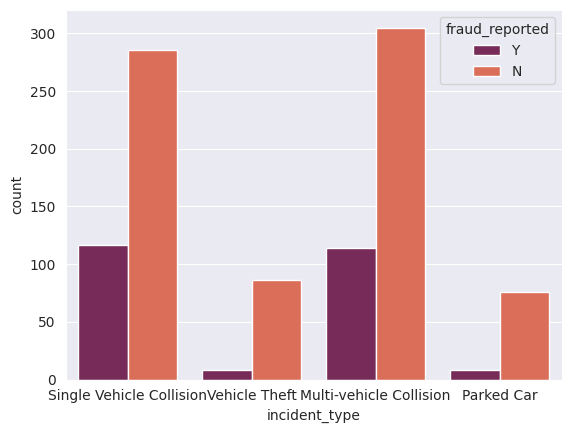

In [72]:
sns.countplot(data=df, hue='fraud_reported',x='incident_type',palette='rocket' )
plt.show()

In [73]:
df_plot = pd.crosstab(index=df['authorities_contacted'], columns=df['fraud_reported'])
df_plot

fraud_reported,N,Y
authorities_contacted,,
Ambulance,139,57
Fire,163,60
Other,135,63
Police,231,61


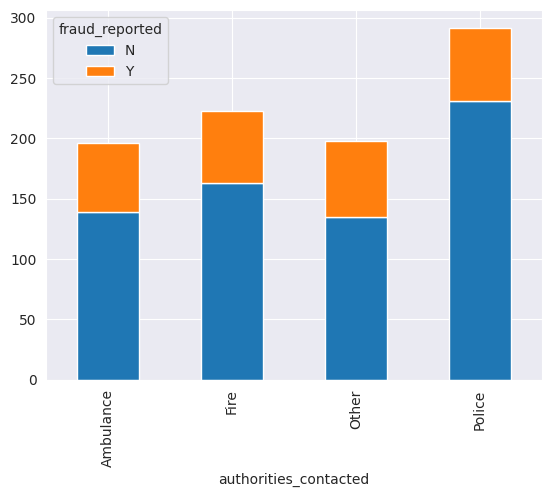

In [74]:
df_plot.plot(kind='bar', stacked=True, )
plt.show()

In [75]:
pd.crosstab(index=df['police_report_available'], columns=df['fraud_reported'])

fraud_reported,N,Y
police_report_available,,
NO,257,86
YES,242,72


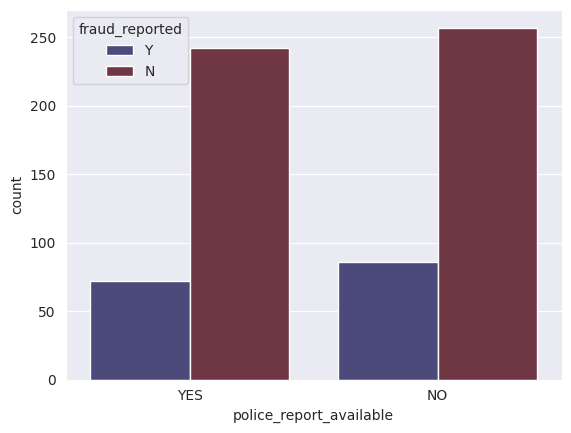

In [76]:
sns.countplot(data=df, hue='fraud_reported',x='police_report_available',palette='icefire' )
plt.show()

In [77]:
pd.crosstab(index=df['property_damage'], columns=df['fraud_reported'])

fraud_reported,N,Y
property_damage,,
NO,272,66
YES,224,78


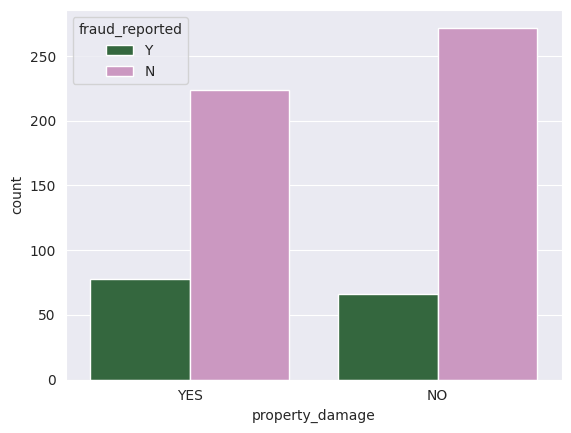

In [78]:
sns.countplot(data=df, hue='fraud_reported',x='property_damage',palette='cubehelix' )
plt.show()

<hr>
<p style="font-size:140%;color:#59bdff">We have studied various countplots, histograms, pie charts, kde plots, swarmplots, boxplots, swarmplots about the numerical columns data.</p>
<p style="font-size:140%;color:#842b68">Then, we took a look at the barplot of mean insurance amount claimed by various factors like occupation, severity of incident, education level, etc.</p>
<p style="font-size:140%;color:#494784">Also, we built multiple crosstabs for many categorical columns with fraud reported column.</p>
<hr>

<h2 style="color:#c6a52c">DATA PREPROCESSING AND FEATURE ENGINEERING ⤵️</h2>

<p style="font-size:120%;color:gray">We will first fill all null values with the help of simple imputer</p>

In [79]:
from sklearn.impute import SimpleImputer

<p style="font-size:120%">COLLISION TYPE, AUTHORITIES CONTACTED, PROPERTY DAMAGE AND POLICE REPORT AVALAIBLE ARE THE 4 COLUMNS WHICH HAVE NULL VALUES AND ALL OF THEM ARE CATEGORICAL COLUMNS WHICH MEAN WE HAVE TO FILL THEM WITH THE MODE OR MOST FREQUENTLY OCCURING VALUES IN TOSE PARTICULAR COLUMNS.</p>

In [80]:
si = SimpleImputer(missing_values=np.nan, strategy='most_frequent')
si

SimpleImputer(strategy='most_frequent')

In [81]:
cols_to_be_filled_for_nullvalues = ['police_report_available','collision_type','authorities_contacted' , 'property_damage']
cols_to_be_filled_for_nullvalues

['police_report_available',
 'collision_type',
 'authorities_contacted',
 'property_damage']

In [82]:
for x in cols_to_be_filled_for_nullvalues:
    df[[x]] = si.fit_transform(df[[x]])
df

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,MALE,MD,craft-repair,sleeping,husband,53300,0,25-01-2015,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,9935 4th Drive,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,21-01-2015,Vehicle Theft,Rear Collision,Minor Damage,Police,VA,Riverwood,6608 MLK Hwy,8,1,NO,0,0,NO,5070,780,780,3510,Mercedes,E400,2007,Y
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,sales,board-games,own-child,35100,0,22-02-2015,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7121 Francis Lane,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,10-01-2015,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,6956 Maple Drive,5,1,NO,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,sales,board-games,unmarried,66000,-46000,17-02-2015,Vehicle Theft,Rear Collision,Minor Damage,Police,NY,Arlington,3041 3rd Ave,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,FEMALE,Masters,craft-repair,paintball,unmarried,0,0,22-02-2015,Single Vehicle Collision,Front Collision,Minor Damage,Fire,NC,Northbrook,6045 Andromedia St,20,1,YES,0,1,NO,87200,17440,8720,61040,Honda,Accord,2006,N
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,FEMALE,PhD,prof-specialty,sleeping,wife,70900,0,24-01-2015,Single Vehicle Collision,Rear Collision,Major Damage,Fire,SC,Northbend,3092 Texas Drive,23,1,YES,2,3,NO,108480,18080,18080,72320,Volkswagen,Passat,2015,N
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,FEMALE,Masters,armed-forces,bungie-jumping,other-relative,35100,0,23-01-2015,Multi-vehicle Collision,Side Collision,Minor Damage,Police,NC,Arlington,7629 5th St,4,3,NO,2,3,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,MALE,Associate,handlers-cleaners,base-jumping,wife,0,0,26-02-2015,Single Vehicle Collision,Rear Collision,Major Damage,Other,NY,Arlington,6128 Elm Lane,2,1,NO,0,1,YES,46980,5220,5220,36540,Audi,A5,1998,N


In [83]:
df.isnull().sum().sum()

0

In [84]:
#First we will drop some irrelevant columns 

In [85]:
df.drop(['policy_number', 'policy_bind_date', 'incident_date', 'incident_location','auto_model', 'auto_year'], axis=1, inplace=True)
df

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,fraud_reported
0,328,48,OH,250/500,1000,1406.91,0,466132,MALE,MD,craft-repair,sleeping,husband,53300,0,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,Y
1,228,42,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,Vehicle Theft,Rear Collision,Minor Damage,Police,VA,Riverwood,8,1,NO,0,0,NO,5070,780,780,3510,Mercedes,Y
2,134,29,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,sales,board-games,own-child,35100,0,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,N
3,256,41,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,5,1,NO,1,2,NO,63400,6340,6340,50720,Chevrolet,Y
4,228,44,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,sales,board-games,unmarried,66000,-46000,Vehicle Theft,Rear Collision,Minor Damage,Police,NY,Arlington,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,N
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,OH,500/1000,1000,1310.80,0,431289,FEMALE,Masters,craft-repair,paintball,unmarried,0,0,Single Vehicle Collision,Front Collision,Minor Damage,Fire,NC,Northbrook,20,1,YES,0,1,NO,87200,17440,8720,61040,Honda,N
996,285,41,IL,100/300,1000,1436.79,0,608177,FEMALE,PhD,prof-specialty,sleeping,wife,70900,0,Single Vehicle Collision,Rear Collision,Major Damage,Fire,SC,Northbend,23,1,YES,2,3,NO,108480,18080,18080,72320,Volkswagen,N
997,130,34,OH,250/500,500,1383.49,3000000,442797,FEMALE,Masters,armed-forces,bungie-jumping,other-relative,35100,0,Multi-vehicle Collision,Side Collision,Minor Damage,Police,NC,Arlington,4,3,NO,2,3,YES,67500,7500,7500,52500,Suburu,N
998,458,62,IL,500/1000,2000,1356.92,5000000,441714,MALE,Associate,handlers-cleaners,base-jumping,wife,0,0,Single Vehicle Collision,Rear Collision,Major Damage,Other,NY,Arlington,2,1,NO,0,1,YES,46980,5220,5220,36540,Audi,N


<p style="font-size:140%;color:#494784">LABEL ENCODING FOR TARGET VARIABLE FRAUD REPORTED</p>

In [86]:
from sklearn.preprocessing import LabelEncoder

In [87]:
enc = LabelEncoder()

In [89]:
df['fraud_reported'] = enc.fit_transform(df['fraud_reported'])
df

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,fraud_reported
0,328,48,OH,250/500,1000,1406.91,0,466132,MALE,MD,craft-repair,sleeping,husband,53300,0,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,1
1,228,42,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,Vehicle Theft,Rear Collision,Minor Damage,Police,VA,Riverwood,8,1,NO,0,0,NO,5070,780,780,3510,Mercedes,1
2,134,29,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,sales,board-games,own-child,35100,0,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,0
3,256,41,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,5,1,NO,1,2,NO,63400,6340,6340,50720,Chevrolet,1
4,228,44,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,sales,board-games,unmarried,66000,-46000,Vehicle Theft,Rear Collision,Minor Damage,Police,NY,Arlington,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,OH,500/1000,1000,1310.80,0,431289,FEMALE,Masters,craft-repair,paintball,unmarried,0,0,Single Vehicle Collision,Front Collision,Minor Damage,Fire,NC,Northbrook,20,1,YES,0,1,NO,87200,17440,8720,61040,Honda,0
996,285,41,IL,100/300,1000,1436.79,0,608177,FEMALE,PhD,prof-specialty,sleeping,wife,70900,0,Single Vehicle Collision,Rear Collision,Major Damage,Fire,SC,Northbend,23,1,YES,2,3,NO,108480,18080,18080,72320,Volkswagen,0
997,130,34,OH,250/500,500,1383.49,3000000,442797,FEMALE,Masters,armed-forces,bungie-jumping,other-relative,35100,0,Multi-vehicle Collision,Side Collision,Minor Damage,Police,NC,Arlington,4,3,NO,2,3,YES,67500,7500,7500,52500,Suburu,0
998,458,62,IL,500/1000,2000,1356.92,5000000,441714,MALE,Associate,handlers-cleaners,base-jumping,wife,0,0,Single Vehicle Collision,Rear Collision,Major Damage,Other,NY,Arlington,2,1,NO,0,1,YES,46980,5220,5220,36540,Audi,0


<p style="font-size:140%;color:#acc734">We have encoded fraud reported column with 1 for Yes and 0 for No values.</p>

In [90]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 33 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_state                 1000 non-null   object 
 3   policy_csl                   1000 non-null   object 
 4   policy_deductable            1000 non-null   int64  
 5   policy_annual_premium        1000 non-null   float64
 6   umbrella_limit               1000 non-null   int64  
 7   insured_zip                  1000 non-null   int64  
 8   insured_sex                  1000 non-null   object 
 9   insured_education_level      1000 non-null   object 
 10  insured_occupation           1000 non-null   object 
 11  insured_hobbies              1000 non-null   object 
 12  insured_relationship         1000 non-null   object 
 13  capital-gains      

In [91]:
cat_cols = []
for x in df.columns:
    if df[x].dtype=='object':
        print(x)
        cat_cols.append(x)

policy_state
policy_csl
insured_sex
insured_education_level
insured_occupation
insured_hobbies
insured_relationship
incident_type
collision_type
incident_severity
authorities_contacted
incident_state
incident_city
property_damage
police_report_available
auto_make


In [92]:
#Above is the new categorical column list prepared for one hot encoding

<p style="font-size:140%;color:#aa55ff">CATEGORICAL COLUMNS ENCODING USING ONE HOT ENCODING TECHNIQUE ⤵️</p>

In [96]:
df = pd.get_dummies(data=df, columns=cat_cols, dtype=int, drop_first=True)
df

,months_as_customer,age,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,fraud_reported,policy_state_IN,policy_state_OH,policy_csl_250/500,policy_csl_500/1000,insured_sex_MALE,insured_education_level_College,insured_education_level_High School,insured_education_level_JD,insured_education_level_MD,insured_education_level_Masters,insured_education_level_PhD,insured_occupation_armed-forces,insured_occupation_craft-repair,insured_occupation_exec-managerial,insured_occupation_farming-fishing,insured_occupation_handlers-cleaners,insured_occupation_machine-op-inspct,insured_occupation_other-service,insured_occupation_priv-house-serv,insured_occupation_prof-specialty,insured_occupation_protective-serv,insured_occupation_sales,insured_occupation_tech-support,insured_occupation_transport-moving,insured_hobbies_basketball,insured_hobbies_board-games,insured_hobbies_bungie-jumping,insured_hobbies_camping,insured_hobbies_chess,insured_hobbies_cross-fit,insured_hobbies_dancing,insured_hobbies_exercise,insured_hobbies_golf,insured_hobbies_hiking,insured_hobbies_kayaking,insured_hobbies_movies,insured_hobbies_paintball,insured_hobbies_polo,insured_hobbies_reading,insured_hobbies_skydiving,insured_hobbies_sleeping,insured_hobbies_video-games,insured_hobbies_yachting,insured_relationship_not-in-family,insured_relationship_other-relative,insured_relationship_own-child,insured_relationship_unmarried,insured_relationship_wife,incident_type_Parked Car,incident_type_Single Vehicle Collision,incident_type_Vehicle Theft,collision_type_Rear Collision,collision_type_Side Collision,incident_severity_Minor Damage,incident_severity_Total Loss,incident_severity_Trivial Damage,authorities_contacted_Fire,authorities_contacted_Other,authorities_contacted_Police,incident_state_NY,incident_state_OH,incident_state_PA,incident_state_SC,incident_state_VA,incident_state_WV,incident_city_Columbus,incident_city_Hillsdale,incident_city_Northbend,incident_city_Northbrook,incident_city_Riverwood,incident_city_Springfield,property_damage_YES,police_report_available_YES,auto_make_Audi,auto_make_BMW,auto_make_Chevrolet,auto_make_Dodge,auto_make_Ford,auto_make_Honda,auto_make_Jeep,auto_make_Mercedes,auto_make_Nissan,auto_make_Saab,auto_make_Suburu,auto_make_Toyota,auto_make_Volkswagen
0,328,48,1000,1406.91,0,466132,53300,0,5,1,1,2,71610,6510,13020,52080,1,0,1,1,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0
1,228,42,2000,1197.22,5000000,468176,0,0,8,1,0,0,5070,780,780,3510,1,1,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,1,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
2,134,29,2000,1413.14,5000000,430632,35100,0,7,3,2,3,34650,7700,3850,23100,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
3,256,41,2000,1415.74,6000000,608117,48900,-62400,5,1,1,2,63400,6340,6340,50720,1,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
4,228,44,1000,1583.91,6000000,610706,66000,-46000,20,1,0,1,6500,1300,650,4550,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,..

<p style="font-size:140%;color:#eb8f1f">Removing Skewness from Umbrella Limit column ⤵️</p>

In [98]:
from sklearn.preprocessing import PowerTransformer

In [99]:
df['umbrella_limit'].value_counts()

umbrella_limit
 0           798
 6000000      57
 5000000      46
 4000000      39
 7000000      29
 3000000      12
 8000000       8
 9000000       5
 2000000       3
 10000000      2
-1000000       1
Name: count, dtype: int64

<p style="font-size:140%;color:#2805eb">As this column contains negative values, we will use power transformer yeo-johnson technique to remove skewness

In [101]:
powertransformer = PowerTransformer(method='yeo-johnson',standardize=True,copy=True)

In [104]:
df[['umbrella_limit']] = powertransformer.fit_transform(df[['umbrella_limit']])
df

,months_as_customer,age,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,fraud_reported,policy_state_IN,policy_state_OH,policy_csl_250/500,policy_csl_500/1000,insured_sex_MALE,insured_education_level_College,insured_education_level_High School,insured_education_level_JD,insured_education_level_MD,insured_education_level_Masters,insured_education_level_PhD,insured_occupation_armed-forces,insured_occupation_craft-repair,insured_occupation_exec-managerial,insured_occupation_farming-fishing,insured_occupation_handlers-cleaners,insured_occupation_machine-op-inspct,insured_occupation_other-service,insured_occupation_priv-house-serv,insured_occupation_prof-specialty,insured_occupation_protective-serv,insured_occupation_sales,insured_occupation_tech-support,insured_occupation_transport-moving,insured_hobbies_basketball,insured_hobbies_board-games,insured_hobbies_bungie-jumping,insured_hobbies_camping,insured_hobbies_chess,insured_hobbies_cross-fit,insured_hobbies_dancing,insured_hobbies_exercise,insured_hobbies_golf,insured_hobbies_hiking,insured_hobbies_kayaking,insured_hobbies_movies,insured_hobbies_paintball,insured_hobbies_polo,insured_hobbies_reading,insured_hobbies_skydiving,insured_hobbies_sleeping,insured_hobbies_video-games,insured_hobbies_yachting,insured_relationship_not-in-family,insured_relationship_other-relative,insured_relationship_own-child,insured_relationship_unmarried,insured_relationship_wife,incident_type_Parked Car,incident_type_Single Vehicle Collision,incident_type_Vehicle Theft,collision_type_Rear Collision,collision_type_Side Collision,incident_severity_Minor Damage,incident_severity_Total Loss,incident_severity_Trivial Damage,authorities_contacted_Fire,authorities_contacted_Other,authorities_contacted_Police,incident_state_NY,incident_state_OH,incident_state_PA,incident_state_SC,incident_state_VA,incident_state_WV,incident_city_Columbus,incident_city_Hillsdale,incident_city_Northbend,incident_city_Northbrook,incident_city_Riverwood,incident_city_Springfield,property_damage_YES,police_report_available_YES,auto_make_Audi,auto_make_BMW,auto_make_Chevrolet,auto_make_Dodge,auto_make_Ford,auto_make_Honda,auto_make_Jeep,auto_make_Mercedes,auto_make_Nissan,auto_make_Saab,auto_make_Suburu,auto_make_Toyota,auto_make_Volkswagen
0,328,48,1000,1406.91,-0.349113,466132,53300,0,5,1,1,2,71610,6510,13020,52080,1,0,1,1,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0
1,228,42,2000,1197.22,1.357817,468176,0,0,8,1,0,0,5070,780,780,3510,1,1,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,1,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
2,134,29,2000,1413.14,1.357817,430632,35100,0,7,3,2,3,34650,7700,3850,23100,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
3,256,41,2000,1415.74,1.644005,608117,48900,-62400,5,1,1,2,63400,6340,6340,50720,1,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
4,228,44,1000,1583.91,1.644005,610706,66000,-46000,20,1,0,1,6500,1300,650,4550,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,..

In [116]:
num_cols.append('fraud_reported')
num_cols

['months_as_customer',
 'age',
 'policy_number',
 'policy_deductable',
 'policy_annual_premium',
 'umbrella_limit',
 'insured_zip',
 'capital-gains',
 'capital-loss',
 'incident_hour_of_the_day',
 'number_of_vehicles_involved',
 'bodily_injuries',
 'witnesses',
 'total_claim_amount',
 'injury_claim',
 'property_claim',
 'vehicle_claim',
 'auto_year',
 'fraud_reported',
 'fraud_reported']

In [120]:
num_cols.remove('policy_number')
num_cols.remove('auto_year')
num_cols

['months_as_customer',
 'age',
 'policy_deductable',
 'policy_annual_premium',
 'umbrella_limit',
 'insured_zip',
 'capital-gains',
 'capital-loss',
 'incident_hour_of_the_day',
 'number_of_vehicles_involved',
 'bodily_injuries',
 'witnesses',
 'total_claim_amount',
 'injury_claim',
 'property_claim',
 'vehicle_claim',
 'fraud_reported',
 'fraud_reported']

In [124]:
num_cols.remove('fraud_reported')
num_cols

['months_as_customer',
 'age',
 'policy_deductable',
 'policy_annual_premium',
 'umbrella_limit',
 'insured_zip',
 'capital-gains',
 'capital-loss',
 'incident_hour_of_the_day',
 'number_of_vehicles_involved',
 'bodily_injuries',
 'witnesses',
 'total_claim_amount',
 'injury_claim',
 'property_claim',
 'vehicle_claim',
 'fraud_reported']

In [111]:
df.corr()

,months_as_customer,age,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,fraud_reported,policy_state_IN,policy_state_OH,policy_csl_250/500,policy_csl_500/1000,insured_sex_MALE,insured_education_level_College,insured_education_level_High School,insured_education_level_JD,insured_education_level_MD,insured_education_level_Masters,insured_education_level_PhD,insured_occupation_armed-forces,insured_occupation_craft-repair,insured_occupation_exec-managerial,insured_occupation_farming-fishing,insured_occupation_handlers-cleaners,insured_occupation_machine-op-inspct,insured_occupation_other-service,insured_occupation_priv-house-serv,insured_occupation_prof-specialty,insured_occupation_protective-serv,insured_occupation_sales,insured_occupation_tech-support,insured_occupation_transport-moving,insured_hobbies_basketball,insured_hobbies_board-games,insured_hobbies_bungie-jumping,insured_hobbies_camping,insured_hobbies_chess,insured_hobbies_cross-fit,insured_hobbies_dancing,insured_hobbies_exercise,insured_hobbies_golf,insured_hobbies_hiking,insured_hobbies_kayaking,insured_hobbies_movies,insured_hobbies_paintball,insured_hobbies_polo,insured_hobbies_reading,insured_hobbies_skydiving,insured_hobbies_sleeping,insured_hobbies_video-games,insured_hobbies_yachting,insured_relationship_not-in-family,insured_relationship_other-relative,insured_relationship_own-child,insured_relationship_unmarried,insured_relationship_wife,incident_type_Parked Car,incident_type_Single Vehicle Collision,incident_type_Vehicle Theft,collision_type_Rear Collision,collision_type_Side Collision,incident_severity_Minor Damage,incident_severity_Total Loss,incident_severity_Trivial Damage,authorities_contacted_Fire,authorities_contacted_Other,authorities_contacted_Police,incident_state_NY,incident_state_OH,incident_state_PA,incident_state_SC,incident_state_VA,incident_state_WV,incident_city_Columbus,incident_city_Hillsdale,incident_city_Northbend,incident_city_Northbrook,incident_city_Riverwood,incident_city_Springfield,property_damage_YES,police_report_available_YES,auto_make_Audi,auto_make_BMW,auto_make_Chevrolet,auto_make_Dodge,auto_make_Ford,auto_make_Honda,auto_make_Jeep,auto_make_Mercedes,auto_make_Nissan,auto_make_Saab,auto_make_Suburu,auto_make_Toyota,auto_make_Volkswagen
months_as_customer,1.000000,0.922098,0.026807,0.005018,-0.003277,0.017895,0.006399,0.020209,0.070639,0.014736,-0.010162,0.058383,0.062108,0.065329,0.034940,0.061013,0.020544,0.009288,-0.004783,-0.005078,-2.088569e-02,0.060925,-0.034985,-0.029863,-0.041588,0.059231,0.012031,-0.013436,-0.022490,0.021728,-0.003231,-0.000293,-0.000327,-0.009388,-0.020059,0.005999,0.001649,-0.003545,0.009823,-0.007241,0.022673,0.031823,0.054288,0.084584,0.029719,0.059418,0.016770,-0.007327,0.012320,-0.083623,-0.017091,0.011401,-0.003030,0.030989,-0.052683,0.017008,-0.010941,-0.013374,-0.054822,-0.058991,-0.021252,-0.021699,0.028646,0.028707,0.037900,-0.030366,0.015691,-0.029416,-0.048958,-0.031912,0.036337,-0.027316,-0.056849,0.033914,0.002554,-0.009662,0.023087,-0.012810,-0.045072,-0.016093,-0.014693,0.031986,0.020206,0.029881,0.018258,-0.038703,0.020135,-0.014281,0.005488,-0.022146,-0.028079,-0.045248,0.012906,-0.044926,0.015478,-0.039476,0.016515,0.095613,-0.032650,0.041350,0.018059,-0.037225,0.031905
age,0.922098,1.000000,0.029188,0.014404,0.005086,0.025604,-0.007075,0.007368,0.087161,0.022102,-0.015679,0.052359,0.069863,0.075522,0.060898,0.062588,0.012143,-0.018196,-0.003827,0.002581,-1.466615e-02,0.073337,-0.014266,-0.038122,-0.045159,0.061883,-0.002052,0.000496,-0.027386,0.008718,-0.014890,-0.021617,0.008140,-0.004584,0.003705,0.003278,0.001342,-0.004381,0.014850,-0.015080,0.029958,0.043951,0.042755,0.075178,0.007135,0.070745,0.015974,-0.004189,0.008481,-0.076888,-0.010006,0.012015,-0.016392,0.020757,-0.042181,0.007750,-0.00884

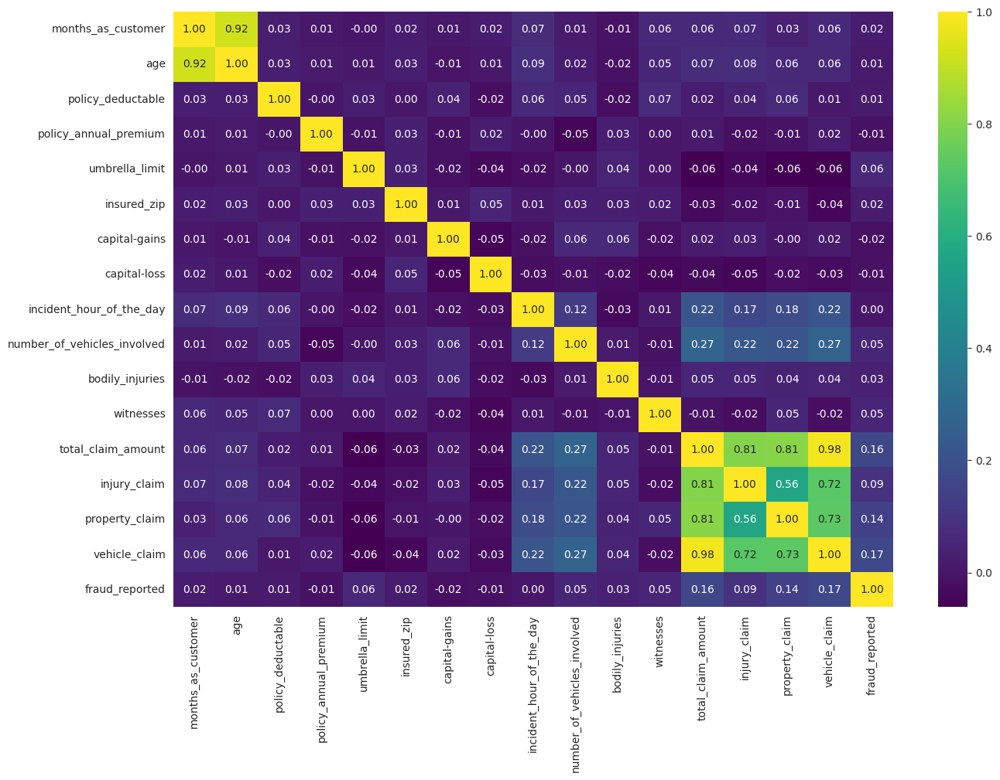

In [125]:
plt.figure(figsize=(15,10))
sns.heatmap(data=df[num_cols].corr(), annot=True, fmt='0.2f', cmap='viridis')
plt.show()

<p style="font-size:140%;color:#ff1c1f">We have now removed skewness from our dataset.</p>

<hr>

<p style="font-size:140%;color:#494784">SPLITTING THE DATA INTO TRAINING DATA AND TESTING DATA ⤵️</p>

In [174]:
X = df.drop('fraud_reported', axis=1)
y = df['fraud_reported']

In [175]:
from sklearn.model_selection import train_test_split

In [176]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=101)

In [177]:
X_train.shape

(800, 102)

In [178]:
X_test.shape

(200, 102)

<p style="font-size:140%;color:#ff867b">SMOTE OVERSAMPLING TECHNIQUE ⤵️</p

In [179]:
y_train.value_counts()

fraud_reported
0    593
1    207
Name: count, dtype: int64

<p style="font-size:140%;color:#ff5afd">As you can see our training data is imbalanced and our model will not learn about both the classes. So, we will use oversampling technique Synthetic Minority OverSampling Technique (SMOTE) to remove this problem.</p>

In [180]:
from imblearn.over_sampling import SMOTE

In [181]:
smote = SMOTE()

In [182]:
X_train, y_train = smote.fit_resample(X_train, y_train)

In [183]:
X_train

,months_as_customer,age,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,policy_state_IN,policy_state_OH,policy_csl_250/500,policy_csl_500/1000,insured_sex_MALE,insured_education_level_College,insured_education_level_High School,insured_education_level_JD,insured_education_level_MD,insured_education_level_Masters,insured_education_level_PhD,insured_occupation_armed-forces,insured_occupation_craft-repair,insured_occupation_exec-managerial,insured_occupation_farming-fishing,insured_occupation_handlers-cleaners,insured_occupation_machine-op-inspct,insured_occupation_other-service,insured_occupation_priv-house-serv,insured_occupation_prof-specialty,insured_occupation_protective-serv,insured_occupation_sales,insured_occupation_tech-support,insured_occupation_transport-moving,insured_hobbies_basketball,insured_hobbies_board-games,insured_hobbies_bungie-jumping,insured_hobbies_camping,insured_hobbies_chess,insured_hobbies_cross-fit,insured_hobbies_dancing,insured_hobbies_exercise,insured_hobbies_golf,insured_hobbies_hiking,insured_hobbies_kayaking,insured_hobbies_movies,insured_hobbies_paintball,insured_hobbies_polo,insured_hobbies_reading,insured_hobbies_skydiving,insured_hobbies_sleeping,insured_hobbies_video-games,insured_hobbies_yachting,insured_relationship_not-in-family,insured_relationship_other-relative,insured_relationship_own-child,insured_relationship_unmarried,insured_relationship_wife,incident_type_Parked Car,incident_type_Single Vehicle Collision,incident_type_Vehicle Theft,collision_type_Rear Collision,collision_type_Side Collision,incident_severity_Minor Damage,incident_severity_Total Loss,incident_severity_Trivial Damage,authorities_contacted_Fire,authorities_contacted_Other,authorities_contacted_Police,incident_state_NY,incident_state_OH,incident_state_PA,incident_state_SC,incident_state_VA,incident_state_WV,incident_city_Columbus,incident_city_Hillsdale,incident_city_Northbend,incident_city_Northbrook,incident_city_Riverwood,incident_city_Springfield,property_damage_YES,police_report_available_YES,auto_make_Audi,auto_make_BMW,auto_make_Chevrolet,auto_make_Dodge,auto_make_Ford,auto_make_Honda,auto_make_Jeep,auto_make_Mercedes,auto_make_Nissan,auto_make_Saab,auto_make_Suburu,auto_make_Toyota,auto_make_Volkswagen
0,297,48,1000,1538.600000,-0.349113,618455,0,-54700,12,1,0,0,60600,6060,12120,42420,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,1,1,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
1,428,59,500,1344.360000,1.923100,473329,0,0,8,1,2,3,6500,1300,650,4550,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
2,209,36,2000,1223.390000,-0.349113,452218,0,0,17,3,1,3,65440,8180,8180,49080,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
3,208,36,500,1153.490000,-0.349113,432711,0,0,16,3,1,0,50500,10100,5050,35350,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0
4,80,26,1000,1343.000000,-0.349113,443625,64600,0,12,1,0,0,90400,9040,9040,72320,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,

In [184]:
X_train.shape

(1186, 102)

In [185]:
#See now we have 1216 equally distributed classes samples instead of 800 unevenly distributed samples

In [186]:
y_train.value_counts()

fraud_reported
0    593
1    593
Name: count, dtype: int64

<hr>

<p style="font-size:140%;color:#494784">DATA SCALING ⤵️</p>

In [187]:
from sklearn.preprocessing import StandardScaler

In [188]:
scaler = StandardScaler()

In [189]:
X_train = pd.DataFrame(scaler.fit_transform(X_train), columns=X_train.columns)
X_train

,months_as_customer,age,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,policy_state_IN,policy_state_OH,policy_csl_250/500,policy_csl_500/1000,insured_sex_MALE,insured_education_level_College,insured_education_level_High School,insured_education_level_JD,insured_education_level_MD,insured_education_level_Masters,insured_education_level_PhD,insured_occupation_armed-forces,insured_occupation_craft-repair,insured_occupation_exec-managerial,insured_occupation_farming-fishing,insured_occupation_handlers-cleaners,insured_occupation_machine-op-inspct,insured_occupation_other-service,insured_occupation_priv-house-serv,insured_occupation_prof-specialty,insured_occupation_protective-serv,insured_occupation_sales,insured_occupation_tech-support,insured_occupation_transport-moving,insured_hobbies_basketball,insured_hobbies_board-games,insured_hobbies_bungie-jumping,insured_hobbies_camping,insured_hobbies_chess,insured_hobbies_cross-fit,insured_hobbies_dancing,insured_hobbies_exercise,insured_hobbies_golf,insured_hobbies_hiking,insured_hobbies_kayaking,insured_hobbies_movies,insured_hobbies_paintball,insured_hobbies_polo,insured_hobbies_reading,insured_hobbies_skydiving,insured_hobbies_sleeping,insured_hobbies_video-games,insured_hobbies_yachting,insured_relationship_not-in-family,insured_relationship_other-relative,insured_relationship_own-child,insured_relationship_unmarried,insured_relationship_wife,incident_type_Parked Car,incident_type_Single Vehicle Collision,incident_type_Vehicle Theft,collision_type_Rear Collision,collision_type_Side Collision,incident_severity_Minor Damage,incident_severity_Total Loss,incident_severity_Trivial Damage,authorities_contacted_Fire,authorities_contacted_Other,authorities_contacted_Police,incident_state_NY,incident_state_OH,incident_state_PA,incident_state_SC,incident_state_VA,incident_state_WV,incident_city_Columbus,incident_city_Hillsdale,incident_city_Northbend,incident_city_Northbrook,incident_city_Riverwood,incident_city_Springfield,property_damage_YES,police_report_available_YES,auto_make_Audi,auto_make_BMW,auto_make_Chevrolet,auto_make_Dodge,auto_make_Ford,auto_make_Honda,auto_make_Jeep,auto_make_Mercedes,auto_make_Nissan,auto_make_Saab,auto_make_Suburu,auto_make_Toyota,auto_make_Volkswagen
0,0.814913,1.010429,-0.247184,1.182278,-0.428048,1.659664,-0.881647,-1.003860,0.069390,-0.806051,-1.158639,-1.272215,0.269628,-0.298256,1.058638,0.183345,1.778034,-0.627419,-0.627419,-0.540314,-0.794583,-0.305103,-0.371747,-0.380510,2.980492,-0.327683,-0.303449,-0.234862,-0.236854,-0.257967,-0.203136,-0.200875,-0.248541,4.492056,-0.226756,-0.240799,-0.220521,-0.226756,-0.244693,-0.242752,-0.13426,-0.184396,-0.200875,-0.198593,-0.198593,-0.155498,-0.17438,-0.198593,-0.18923,-0.193960,5.035430,-0.19396,-0.211976,-0.17438,-0.207595,-0.19396,-0.169177,-0.191607,-0.198593,-0.376141,-0.386296,-0.390609,-0.347826,2.711478,-0.254228,1.393890,-0.283100,-0.803080,1.934942,1.703325,-0.481215,-0.261665,2.247448,-0.439499,-0.645729,-0.475892,-0.13426,-0.134260,1.975051,-0.284834,-0.429901,-0.346301,-0.353889,3.051728,-0.316521,-0.333958,-0.352379,-0.562419,-0.533798,-0.234862,-0.224693,-0.222615,-0.250448,4.187034,-0.196288,-0.236854,-0.216283,-0.220521,-0.240799,-0.244693,-0.220521,-0.218411
1,2.002889,2.245628,-1.102180,0.362531,1.935982,-0.391885,-0.881647,0.953699,-0.550547,-0.806051,1.362729,1.567523,-1.945838,-1.340256,-1.519309,-1.961808,1.778034,-0.627419,1.593831,-0.540314,-0.794583,-0.305103,-0.371747,2.628054,-0.335515,-0.327683,-0.303449,-0.234862,-0.236854,-0.257967,-0.203136,-0.200875,-0.248541,-0.222615,-0.226756,4.152849,-0.220521,-0.226756,-0.244693,-0.242752,-0.13426,-0.184396,-0.200875,-0.198593,-0.198593,-0.155498,-0.17438,-0.198593,-0.18923,5.155715,-0.198593,-0.19396,-0.211976,-0.17438,-0.207595,-0.19396,-0.169177,-0.1

In [190]:
X_test = pd.DataFrame(scaler.transform(X_test), columns=X_test.columns)
X_test

,months_as_customer,age,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,policy_state_IN,policy_state_OH,policy_csl_250/500,policy_csl_500/1000,insured_sex_MALE,insured_education_level_College,insured_education_level_High School,insured_education_level_JD,insured_education_level_MD,insured_education_level_Masters,insured_education_level_PhD,insured_occupation_armed-forces,insured_occupation_craft-repair,insured_occupation_exec-managerial,insured_occupation_farming-fishing,insured_occupation_handlers-cleaners,insured_occupation_machine-op-inspct,insured_occupation_other-service,insured_occupation_priv-house-serv,insured_occupation_prof-specialty,insured_occupation_protective-serv,insured_occupation_sales,insured_occupation_tech-support,insured_occupation_transport-moving,insured_hobbies_basketball,insured_hobbies_board-games,insured_hobbies_bungie-jumping,insured_hobbies_camping,insured_hobbies_chess,insured_hobbies_cross-fit,insured_hobbies_dancing,insured_hobbies_exercise,insured_hobbies_golf,insured_hobbies_hiking,insured_hobbies_kayaking,insured_hobbies_movies,insured_hobbies_paintball,insured_hobbies_polo,insured_hobbies_reading,insured_hobbies_skydiving,insured_hobbies_sleeping,insured_hobbies_video-games,insured_hobbies_yachting,insured_relationship_not-in-family,insured_relationship_other-relative,insured_relationship_own-child,insured_relationship_unmarried,insured_relationship_wife,incident_type_Parked Car,incident_type_Single Vehicle Collision,incident_type_Vehicle Theft,collision_type_Rear Collision,collision_type_Side Collision,incident_severity_Minor Damage,incident_severity_Total Loss,incident_severity_Trivial Damage,authorities_contacted_Fire,authorities_contacted_Other,authorities_contacted_Police,incident_state_NY,incident_state_OH,incident_state_PA,incident_state_SC,incident_state_VA,incident_state_WV,incident_city_Columbus,incident_city_Hillsdale,incident_city_Northbend,incident_city_Northbrook,incident_city_Riverwood,incident_city_Springfield,property_damage_YES,police_report_available_YES,auto_make_Audi,auto_make_BMW,auto_make_Chevrolet,auto_make_Dodge,auto_make_Ford,auto_make_Honda,auto_make_Jeep,auto_make_Mercedes,auto_make_Nissan,auto_make_Saab,auto_make_Suburu,auto_make_Toyota,auto_make_Volkswagen
0,-0.690462,-1.123098,-0.247184,-1.182469,-0.428048,-0.300112,1.507918,0.953699,-1.015500,-0.806051,0.102045,1.567523,0.916659,1.720073,0.051733,0.809840,1.778034,-0.627419,1.593831,-0.540314,-0.794583,-0.305103,-0.371747,-0.38051,-0.335515,-0.327683,-0.303449,-0.234862,-0.236854,-0.257967,-0.203136,-0.200875,-0.248541,-0.222615,-0.226756,-0.240799,-0.220521,4.410020,-0.244693,-0.242752,-0.134260,-0.184396,-0.200875,-0.198593,-0.198593,-0.155498,-0.17438,-0.198593,-0.189230,-0.193960,-0.198593,-0.193960,4.717510,-0.17438,-0.207595,-0.19396,-0.169177,-0.191607,-0.198593,-0.376141,-0.386296,2.560105,-0.347826,-0.368803,-0.254228,1.393890,-0.283100,-0.803080,-0.516811,-0.587087,-0.481215,-0.261665,2.247448,-0.439499,-0.645729,-0.475892,-0.13426,-0.13426,1.975051,-0.284834,-0.429901,-0.346301,2.825747,-0.327683,-0.316521,-0.333958,-0.352379,-0.562419,-0.533798,-0.234862,-0.224693,-0.222615,-0.250448,-0.238833,-0.196288,-0.236854,-0.216283,-0.220521,-0.240799,4.086746,-0.220521,-0.218411
1,-0.119145,-0.449353,-1.102180,0.665885,-0.428048,-0.839583,-0.881647,0.953699,-0.705531,-0.806051,0.102045,-1.272215,-1.968771,-1.388416,-1.544032,-1.974837,-0.562419,-0.627419,-0.627419,1.850776,-0.794583,-0.305103,-0.371747,-0.38051,2.980492,-0.327683,-0.303449,-0.234862,-0.236854,-0.257967,-0.203136,-0.200875,-0.248541,-0.222615,-0.226756,-0.240799,-0.220521,-0.226756,-0.244693,-0.242752,-0.134260,-0.184396,-0.200875,-0.198593,-0.198593,-0.155498,-0.17438,-0.198593,5.284584,-0.193960,-0.198593,-0.193960,-0.211976,-0.17438,-0.207595,-0.19396,-0.

In [191]:
y_test.value_counts()

fraud_reported
0    160
1     40
Name: count, dtype: int64

<p style="font-size:140%;color:#2abcc3">Our data is ready for training. Now, we will start training and evaluating various machine learning models one by one.</p>

<hr>

<h2 style="color:#27c327">MACHINE LEARNING MODEL ⤵️</h2>

<p style="font-size:140%;color:#9d7773">We will start with Logistic Regression as this project is about binary classification problem.</p>

<h2>LOGISTIC REGRESSION ↩️</h2>

In [192]:
from sklearn.linear_model import LogisticRegression

In [193]:
log_model = LogisticRegression()

In [194]:
log_model.fit(X_train, y_train)

LogisticRegression()

In [195]:
log_pred = log_model.predict(X_test)
log_pred

array([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1,
       0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1,
       0, 0])

In [196]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, roc_curve, roc_auc_score

In [197]:
from sklearn.metrics import cohen_kappa_score, ConfusionMatrixDisplay

In [198]:
print('ACCURACY SCORE : ', accuracy_score(y_test, log_pred))
print("Training accuracy :", log_model.score(X_train, y_train))
print("Test accuracy :", log_model.score(X_test, y_test))
print('ROC AUC SCORE : ', roc_auc_score(y_test, log_pred))
print('Cohen\'s Kappa Score :', cohen_kappa_score(y_test, log_pred))
print('\n\n \n-------------------Confusion Matrix--------------\n')
print(confusion_matrix(y_test, log_pred))
print('\n\n-------------------Clasification Report--------\n')
print(classification_report(y_test, log_pred))


ACCURACY SCORE :  0.82
Training accuracy : 0.9258010118043845
Test accuracy : 0.82
ROC AUC SCORE :  0.709375
Cohen's Kappa Score : 0.4267515923566879


 
-------------------Confusion Matrix--------------

[[143  17]
 [ 19  21]]


-------------------Clasification Report--------

              precision    recall  f1-score   support

           0       0.88      0.89      0.89       160
           1       0.55      0.53      0.54        40

    accuracy                           0.82       200
   macro avg       0.72      0.71      0.71       200
weighted avg       0.82      0.82      0.82       200



In [199]:
from sklearn.model_selection import cross_val_score
log_score=cross_val_score(log_model, X, y, cv=5, scoring='accuracy')
print(log_score)
print()
print("cross validation score for Logistic Regression :", np.mean(log_score))

[0.75  0.745 0.75  0.755 0.76 ]

cross validation score for Logistic Regression : 0.752


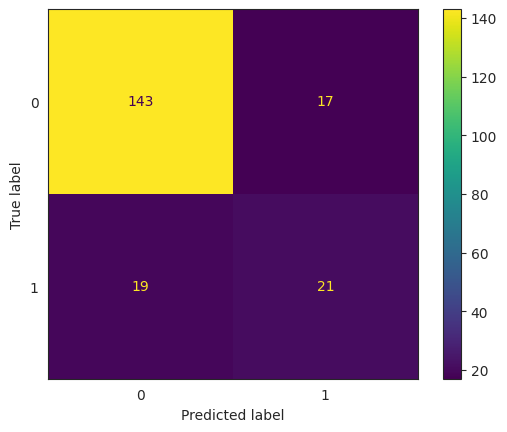

In [200]:
sns.set_style('white')
c1 = ConfusionMatrixDisplay(confusion_matrix(y_test, log_pred))
c1.plot()
plt.show()

In [201]:
log_pred_proba = log_model.predict_proba(X_test)[:, 1]
log_pred_proba

array([0.48331601, 0.03468049, 0.99631145, 0.02764481, 0.04910542,
       0.16199535, 0.00929299, 0.00812614, 0.05446998, 0.08689087,
       0.02296472, 0.95308543, 0.8726937 , 0.09412878, 0.16791067,
       0.1365169 , 0.18388762, 0.98205998, 0.2830442 , 0.00853616,
       0.20815002, 0.69884946, 0.00146575, 0.01146523, 0.82733183,
       0.01492765, 0.06774041, 0.99988765, 0.05158263, 0.28908524,
       0.0013232 , 0.21593456, 0.95836989, 0.0615428 , 0.05808107,
       0.01520071, 0.05217187, 0.02235176, 0.16465893, 0.71942423,
       0.99961238, 0.36486834, 0.11741784, 0.01748137, 0.03918317,
       0.02697539, 0.07432001, 0.02261328, 0.03323963, 0.01155459,
       0.5624929 , 0.06771818, 0.05744368, 0.31052414, 0.29890351,
       0.05152676, 0.38145845, 0.01964577, 0.83811392, 0.02235286,
       0.19253292, 0.05743089, 0.00276275, 0.00605714, 0.15142965,
       0.12030526, 0.04849527, 0.01927832, 0.04482272, 0.02166208,
       0.00936554, 0.02244582, 0.00873816, 0.13963383, 0.01605

In [202]:
from sklearn.metrics import auc

In [230]:
sns.set_style('darkgrid')

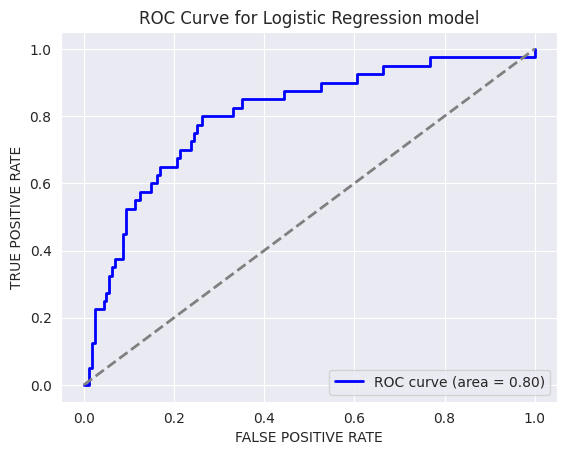

In [231]:
fpr, tpr, _ = roc_curve(y_test, log_pred_proba)
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlabel('FALSE POSITIVE RATE')
plt.ylabel('TRUE POSITIVE RATE')
plt.title('ROC Curve for Logistic Regression model')
plt.legend(loc="lower right")
plt.show()

<p style="font-size:120%;color:#ff1a38">Logistic Regression model is giving good results with 82% accuracy and 0.70 roc auc score which means our model is learning about both the classes decently. There is also no overfitting and underfitting issue as our model is giving training accuracy of 93%.</p>

<h2>DECISION TREE CLASSIFIER ↩️</h2>

In [204]:
from sklearn.tree import DecisionTreeClassifier

In [205]:
dtc = DecisionTreeClassifier()

In [206]:
dtc.fit(X_train, y_train)

DecisionTreeClassifier()

In [207]:
dtc_pred = dtc.predict(X_test)
dtc_pred

array([1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0,
       1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1,
       0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0])

In [208]:
y_test

545    0
298    0
109    1
837    1
194    0
      ..
68     0
449    0
715    1
793    0
688    0
Name: fraud_reported, Length: 200, dtype: int64

In [209]:
print('ACCURACY SCORE : ', accuracy_score(y_test, dtc_pred))
print("Training accuracy :", dtc.score(X_train, y_train))
print("Test accuracy :", dtc.score(X_test, y_test))
print('ROC AUC SCORE : ', roc_auc_score(y_test, dtc_pred))
print('Cohen\'s Kappa Score :', cohen_kappa_score(y_test, dtc_pred))
print('\n\n \n-------------------Confusion Matrix--------------\n')
print(confusion_matrix(y_test, dtc_pred))
print('\n\n-------------------Clasification Report-------------\n')
print(classification_report(y_test, dtc_pred))


ACCURACY SCORE :  0.78
Training accuracy : 1.0
Test accuracy : 0.78
ROC AUC SCORE :  0.703125
Cohen's Kappa Score : 0.37142857142857144


 
-------------------Confusion Matrix--------------

[[133  27]
 [ 17  23]]


-------------------Clasification Report-------------

              precision    recall  f1-score   support

           0       0.89      0.83      0.86       160
           1       0.46      0.57      0.51        40

    accuracy                           0.78       200
   macro avg       0.67      0.70      0.68       200
weighted avg       0.80      0.78      0.79       200



In [210]:
dtc_score=cross_val_score(dtc,X,y,cv=5,scoring='accuracy')
print(dtc_score)
print()
print("cross validation score for Decision Tree :",np.mean(dtc_score))

[0.78  0.825 0.77  0.805 0.805]

cross validation score for Decision Tree : 0.797


<Axes: >

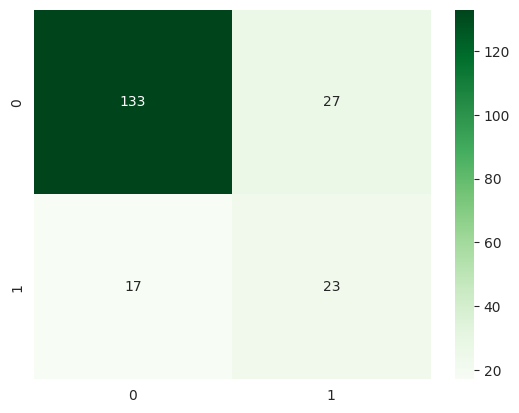

In [211]:
sns.heatmap(confusion_matrix(y_test, dtc_pred),fmt='0.9g',annot=True,cmap='Greens')

In [212]:
dtc_pred_proba = dtc.predict_proba(X_test)[:, 1]
dtc_pred_proba

array([1., 0., 1., 0., 0., 0., 0., 1., 0., 0., 0., 0., 1., 0., 0., 0., 1.,
       1., 0., 0., 0., 0., 0., 0., 1., 0., 0., 1., 0., 0., 0., 1., 1., 0.,
       1., 1., 1., 0., 0., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
       1., 0., 0., 1., 0., 0., 0., 1., 0., 1., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 0., 0., 0., 1., 1., 1.,
       0., 0., 0., 1., 0., 0., 0., 0., 1., 1., 0., 0., 0., 0., 1., 1., 1.,
       1., 0., 1., 0., 0., 0., 1., 0., 0., 0., 1., 0., 1., 0., 0., 0., 1.,
       0., 0., 0., 1., 0., 0., 0., 0., 1., 0., 1., 0., 1., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 1., 1., 0., 0., 0., 0., 1., 0., 1., 0.,
       1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 1., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.])

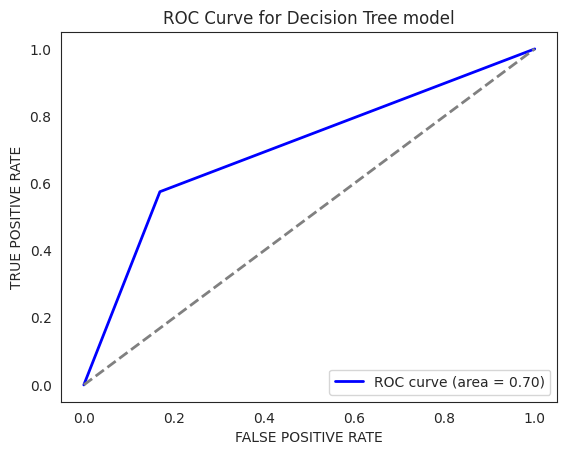

In [236]:
fpr, tpr, _ = roc_curve(y_test, dtc_pred_proba)
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlabel('FALSE POSITIVE RATE')
plt.ylabel('TRUE POSITIVE RATE')
plt.title('ROC Curve for Decision Tree model')
plt.legend(loc="lower right")
plt.show()

<p style="font-size:120%;color:#3826ff">Decision Tree is not a bad model but is slightly less accuracte than Logistic Regression as it gives 72% accuracy and 0.65 roc auc score.</p>

<h2>RANDOM FOREST CLASSIFIER ↩️</h2>

In [214]:
from sklearn.ensemble import RandomForestClassifier

In [215]:
rfc = RandomForestClassifier()

In [216]:
rfc.fit(X_train, y_train)

RandomForestClassifier()

In [217]:
rfc_pred = rfc.predict(X_test)
rfc_pred

array([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1,
       0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1,
       0, 0])

In [218]:
print('ACCURACY SCORE : ', accuracy_score(y_test, rfc_pred))
print("Training accuracy :", rfc.score(X_train, y_train))
print("Test accuracy :", rfc.score(X_test, y_test))
print('ROC AUC SCORE : ', roc_auc_score(y_test, rfc_pred))
print('Cohen\'s Kappa Score :', cohen_kappa_score(y_test, rfc_pred))
print('\n\n \n-------------------Confusion Matrix--------------\n')
print(confusion_matrix(y_test, rfc_pred))
print('\n\n-------------------Clasification Report--------\n')
print(classification_report(y_test, rfc_pred))


ACCURACY SCORE :  0.76
Training accuracy : 1.0
Test accuracy : 0.76
ROC AUC SCORE :  0.5593750000000001
Cohen's Kappa Score : 0.13669064748201432


 
-------------------Confusion Matrix--------------

[[143  17]
 [ 31   9]]


-------------------Clasification Report--------

              precision    recall  f1-score   support

           0       0.82      0.89      0.86       160
           1       0.35      0.23      0.27        40

    accuracy                           0.76       200
   macro avg       0.58      0.56      0.56       200
weighted avg       0.73      0.76      0.74       200



In [219]:
rfc_score=cross_val_score(rfc, X, y, cv=5, scoring='accuracy')
print(rfc_score)
print()
print("cross validation score for Random Forest :", np.mean(rfc_score))

[0.77  0.76  0.765 0.765 0.785]

cross validation score for Random Forest : 0.769


<Axes: >

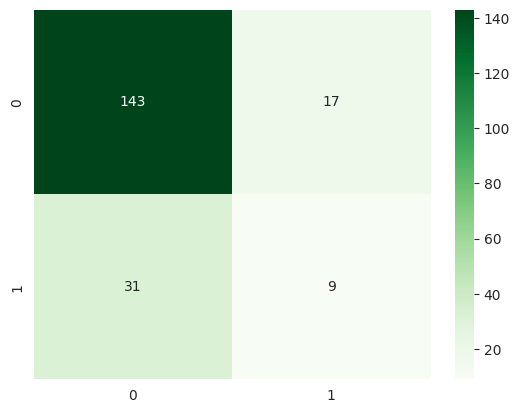

In [220]:
sns.heatmap(confusion_matrix(y_test, rfc_pred),fmt='0.9g', annot=True,cmap='Greens')

In [221]:
rfc_pred_proba = rfc.predict_proba(X_test)[:, 1]
rfc_pred_proba

array([0.66, 0.14, 0.5 , 0.05, 0.32, 0.25, 0.28, 0.16, 0.31, 0.12, 0.09,
       0.52, 0.36, 0.26, 0.18, 0.47, 0.48, 0.74, 0.26, 0.25, 0.28, 0.52,
       0.1 , 0.26, 0.67, 0.21, 0.31, 0.58, 0.29, 0.25, 0.25, 0.45, 0.59,
       0.29, 0.3 , 0.23, 0.35, 0.23, 0.27, 0.66, 0.79, 0.18, 0.4 , 0.28,
       0.24, 0.2 , 0.25, 0.1 , 0.13, 0.23, 0.56, 0.28, 0.33, 0.13, 0.29,
       0.17, 0.31, 0.23, 0.59, 0.25, 0.17, 0.34, 0.17, 0.15, 0.13, 0.47,
       0.17, 0.14, 0.14, 0.31, 0.23, 0.29, 0.12, 0.23, 0.05, 0.26, 0.16,
       0.26, 0.52, 0.22, 0.35, 0.28, 0.18, 0.23, 0.15, 0.3 , 0.36, 0.1 ,
       0.28, 0.17, 0.34, 0.1 , 0.11, 0.23, 0.49, 0.34, 0.21, 0.25, 0.37,
       0.46, 0.5 , 0.44, 0.43, 0.44, 0.31, 0.21, 0.21, 0.13, 0.21, 0.24,
       0.33, 0.57, 0.25, 0.34, 0.23, 0.31, 0.67, 0.41, 0.38, 0.55, 0.17,
       0.38, 0.23, 0.18, 0.19, 0.37, 0.27, 0.2 , 0.21, 0.47, 0.36, 0.28,
       0.26, 0.26, 0.39, 0.53, 0.51, 0.11, 0.18, 0.3 , 0.05, 0.38, 0.44,
       0.33, 0.38, 0.26, 0.5 , 0.13, 0.61, 0.23, 0.

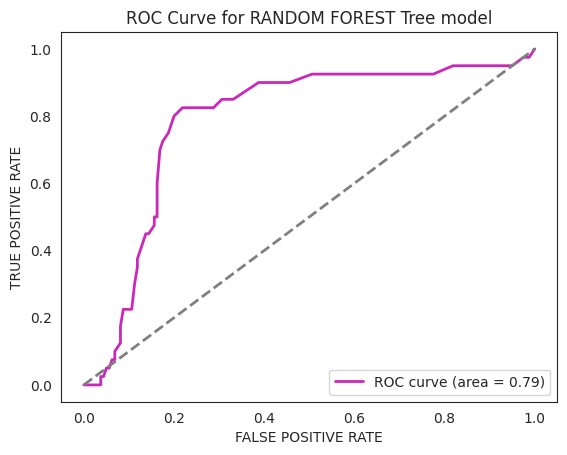

In [235]:
fpr, tpr, _ = roc_curve(y_test, rfc_pred_proba)
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr, color='#cb28bb', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlabel('FALSE POSITIVE RATE')
plt.ylabel('TRUE POSITIVE RATE')
plt.title('ROC Curve for RANDOM FOREST Tree model')
plt.legend(loc="lower right")
plt.show()

<h2>SUPPORT VECTOR MACHINE CLASSIFIER MODEL ↩️</h2>

In [223]:
from sklearn.svm import SVC

In [238]:
svc = SVC(probability=True)

In [239]:
svc.fit(X_train, y_train)

SVC(probability=True)

In [240]:
svc_pred = svc.predict(X_test)
svc_pred

array([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0,
       0, 0])

In [241]:
print('ACCURACY SCORE : ', accuracy_score(y_test, svc_pred))
print("Training accuracy: ",svc.score(X_train,y_train))
print("Test accuracy : ",svc.score(X_test,y_test))
print('ROC AUC SCORE : ', roc_auc_score(y_test, svc_pred))
print('Cohen\'s Kappa Score :', cohen_kappa_score(y_test, svc_pred))
print('\n\n \n---------Confusion Matrix-------------------\n')
print(confusion_matrix(y_test,svc_pred))
print('\n\n \n---------Classification Report--------------\n')
print(classification_report(y_test,svc_pred))

ACCURACY SCORE :  0.825
Training accuracy:  0.9806070826306914
Test accuracy :  0.825
ROC AUC SCORE :  0.609375
Cohen's Kappa Score : 0.2857142857142857


 
---------Confusion Matrix-------------------

[[155   5]
 [ 30  10]]


 
---------Classification Report--------------

              precision    recall  f1-score   support

           0       0.84      0.97      0.90       160
           1       0.67      0.25      0.36        40

    accuracy                           0.82       200
   macro avg       0.75      0.61      0.63       200
weighted avg       0.80      0.82      0.79       200



In [242]:
svc_score=cross_val_score(svc, X, y, cv=5, scoring='accuracy')
print(svc_score)
print()
print("cross validation score for SVM :", np.mean(svc_score))

[0.75  0.75  0.755 0.755 0.755]

cross validation score for SVM : 0.7529999999999999


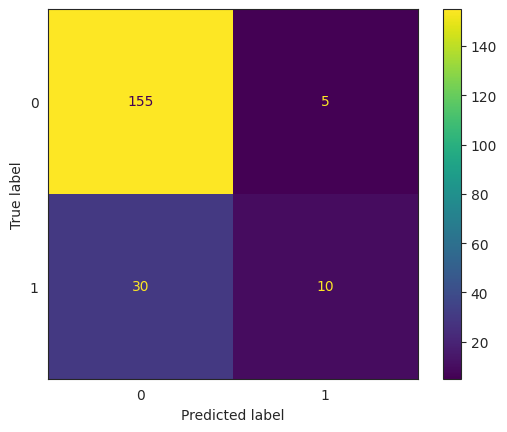

In [243]:
sns.set_style('white')
c2 = ConfusionMatrixDisplay(confusion_matrix(y_test, svc_pred))
c2.plot()
plt.show()

In [244]:
svc_pred_proba = svc.predict_proba(X_test)[:,1]
svc_pred_proba

array([0.66395952, 0.10022742, 0.93776816, 0.07480011, 0.1265994 ,
       0.29989349, 0.04227646, 0.04788716, 0.09698268, 0.11194226,
       0.05716033, 0.69125154, 0.48908838, 0.21462128, 0.16916764,
       0.21213298, 0.24687193, 0.402628  , 0.25808923, 0.05733439,
       0.25853114, 0.33619911, 0.06812666, 0.1009598 , 0.45794292,
       0.07250742, 0.08022134, 0.9648201 , 0.21166651, 0.31806382,
       0.03066435, 0.13258301, 0.72424633, 0.11654195, 0.11397776,
       0.07143284, 0.05998065, 0.05278455, 0.39540518, 0.40017127,
       0.99998766, 0.30539813, 0.12626526, 0.12713308, 0.10131126,
       0.09070042, 0.09330508, 0.09630578, 0.10472951, 0.03820862,
       0.34973191, 0.48154218, 0.16849449, 0.21697045, 0.58589399,
       0.15965865, 0.54194247, 0.1435317 , 0.75341395, 0.07804849,
       0.55559403, 0.33287807, 0.03675134, 0.0345789 , 0.17515092,
       0.3024423 , 0.13158402, 0.04925669, 0.1476472 , 0.06269023,
       0.07421295, 0.10033815, 0.04289895, 0.1819652 , 0.13008

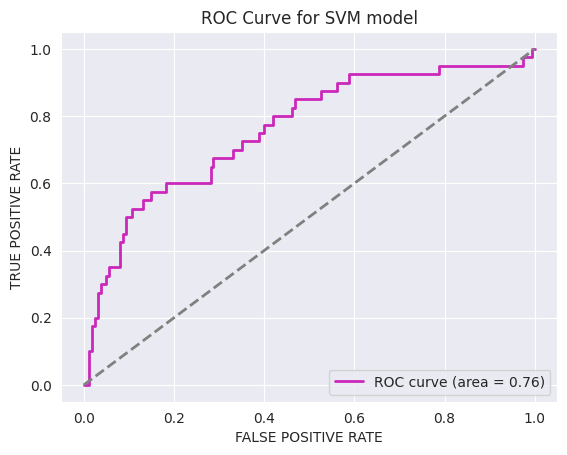

In [246]:
fpr, tpr, _ = roc_curve(y_test, svc_pred_proba)
roc_auc = auc(fpr, tpr)
sns.set_style('darkgrid')
plt.plot(fpr, tpr, color='#cb28bb', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlabel('FALSE POSITIVE RATE')
plt.ylabel('TRUE POSITIVE RATE')
plt.title('ROC Curve for SVM model')
plt.legend(loc="lower right")
plt.show()

<p style="color:#42b9d9;font-size:140%">We see that SVM is also a good model but not better than Random Forest </p>

<h2>KNN MODEL ↩️</h2>

In [247]:
from sklearn.neighbors import KNeighborsClassifier

In [268]:
knn = KNeighborsClassifier(n_neighbors=5)

In [269]:
knn.fit(X_train, y_train)

KNeighborsClassifier()

In [270]:
knn_pred = knn.predict(X_test)
knn_pred

array([1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1,
       0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1,
       1, 1])

In [271]:
print('ACCURACY SCORE : ', accuracy_score(y_test, knn_pred))
print("Training accuracy: ",knn.score(X_train,y_train))
print("Test accuracy : ",knn.score(X_test,y_test))
print('ROC AUC SCORE : ', roc_auc_score(y_test, knn_pred))
print('Cohen\'s Kappa Score :', cohen_kappa_score(y_test, knn_pred))
print('\n\n \n---------Confusion Matrix------------------\n')
print(confusion_matrix(y_test,knn_pred))
print('\n\n \n---------Classification Report--------------\n')
print(classification_report(y_test,knn_pred))

ACCURACY SCORE :  0.225
Training accuracy:  0.5927487352445194
Test accuracy :  0.225
ROC AUC SCORE :  0.50625
Cohen's Kappa Score : 0.005134788189987249


 
---------Confusion Matrix------------------

[[  6 154]
 [  1  39]]


 
---------Classification Report--------------

              precision    recall  f1-score   support

           0       0.86      0.04      0.07       160
           1       0.20      0.97      0.33        40

    accuracy                           0.23       200
   macro avg       0.53      0.51      0.20       200
weighted avg       0.73      0.23      0.12       200



In [272]:
knn_score=cross_val_score(knn,X,y,cv=5,scoring='accuracy')
print(knn_score)
print()
print("cross validation score for KNN :",np.mean(knn_score))

[0.695 0.655 0.69  0.715 0.72 ]

cross validation score for KNN : 0.695


<Axes: >

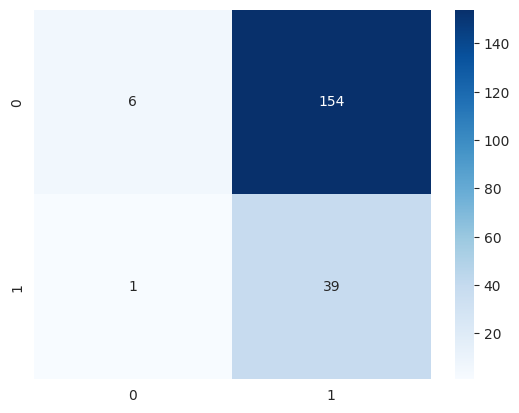

In [273]:
sns.heatmap(confusion_matrix(y_test, knn_pred),fmt='0.9g',annot=True,cmap='Blues')

In [274]:
knn_pred_proba = knn.predict_proba(X_test)[:,1]
knn_pred_proba

array([0.8, 1. , 1. , 0.6, 0.6, 1. , 0.8, 0.8, 0.2, 1. , 0.4, 1. , 1. ,
       1. , 1. , 1. , 1. , 1. , 1. , 0.4, 1. , 0.6, 0.2, 0.6, 0.8, 0.6,
       0.4, 1. , 0.6, 1. , 1. , 0.8, 1. , 0.6, 0.8, 0.8, 1. , 0.8, 1. ,
       1. , 1. , 0.6, 0.8, 0.8, 0.8, 0.6, 0.8, 1. , 0.8, 1. , 0.8, 0.8,
       1. , 1. , 1. , 1. , 1. , 1. , 0.8, 0.6, 1. , 0.8, 1. , 0.8, 1. ,
       1. , 0.8, 0.8, 1. , 0.6, 0.8, 1. , 1. , 1. , 0.8, 1. , 0.8, 0.8,
       0.8, 1. , 1. , 1. , 1. , 1. , 0.8, 0.8, 1. , 0.8, 0.8, 1. , 1. ,
       0.8, 0.8, 1. , 1. , 1. , 0.6, 0.8, 0.8, 0.8, 0.8, 1. , 1. , 0.8,
       0.6, 1. , 0.6, 1. , 1. , 0.8, 0.8, 1. , 1. , 1. , 0.8, 1. , 0.8,
       1. , 1. , 0.6, 0.8, 0.6, 0.8, 1. , 0.8, 1. , 0.8, 0.6, 1. , 1. ,
       0.6, 1. , 1. , 1. , 1. , 1. , 0.8, 0.6, 0.8, 0.8, 0.8, 1. , 0.8,
       0.8, 0.8, 1. , 0.4, 1. , 1. , 0.8, 1. , 0.6, 0.8, 0.8, 1. , 0.8,
       1. , 1. , 1. , 0.8, 1. , 0.8, 1. , 0.8, 1. , 0.8, 1. , 1. , 0.8,
       0.8, 1. , 1. , 0.8, 0.8, 1. , 1. , 0.8, 1. , 1. , 0.8, 1.

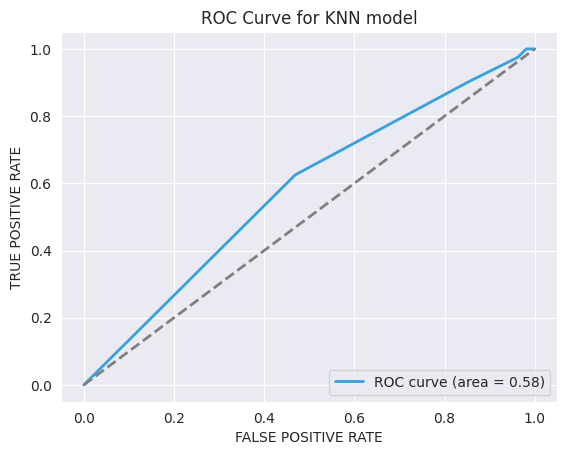

In [276]:
fpr, tpr, _ = roc_curve(y_test, knn_pred_proba)
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr, color='#39a1d9', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlabel('FALSE POSITIVE RATE')
plt.ylabel('TRUE POSITIVE RATE')
plt.title('ROC Curve for KNN model')
plt.legend(loc="lower right")
plt.show()

<p style="font-size:120%;color:#7275b4">KNN is the worst performing model now because it gives only 22% accuracy and by seeing the roc curve and the area under the curve it is clearly visible.</p>

<h2>ADABOOST CLASSIFIER ↩️</h2>

In [277]:
from sklearn.ensemble import AdaBoostClassifier

In [278]:
adaboost = AdaBoostClassifier()

In [279]:
adaboost.fit(X_train, y_train)

AdaBoostClassifier()

In [280]:
adaboost_pred = adaboost.predict(X_test)
adaboost_pred

array([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1,
       0, 0])

In [281]:
print('ACCURACY SCORE : ', accuracy_score(y_test, adaboost_pred))
print("Training accuracy: ",adaboost.score(X_train,y_train))
print("Test accuracy : ",adaboost.score(X_test,y_test))
print('ROC AUC SCORE : ', roc_auc_score(y_test, adaboost_pred))
print('Cohen\'s Kappa Score :', cohen_kappa_score(y_test, adaboost_pred))
print('\n\n \n---------Confusion Matrix-------------------\n')
print(confusion_matrix(y_test,adaboost_pred))
print('\n\n \n---------Classification Report--------------\n')
print(classification_report(y_test,adaboost_pred))

ACCURACY SCORE :  0.8
Training accuracy:  0.9097807757166948
Test accuracy :  0.8
ROC AUC SCORE :  0.6875
Cohen's Kappa Score : 0.375


 
---------Confusion Matrix-------------------

[[140  20]
 [ 20  20]]


 
---------Classification Report--------------

              precision    recall  f1-score   support

           0       0.88      0.88      0.88       160
           1       0.50      0.50      0.50        40

    accuracy                           0.80       200
   macro avg       0.69      0.69      0.69       200
weighted avg       0.80      0.80      0.80       200



In [282]:
adaboost_score=cross_val_score(adaboost,X,y,cv=5,scoring='accuracy')
print(adaboost_score)
print()
print("cross validation score for ADABOOST :",np.mean(adaboost_score))

[0.815 0.78  0.75  0.84  0.815]

cross validation score for ADABOOST : 0.7999999999999999


<Axes: >

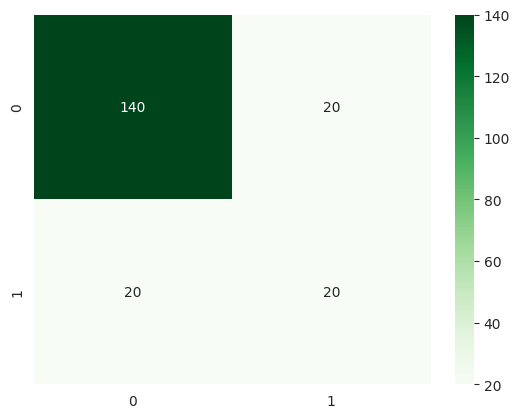

In [283]:
sns.heatmap(confusion_matrix(y_test, adaboost_pred),fmt='0.9g', annot=True,cmap='Greens')

In [284]:
adaboost_pred_proba = adaboost.predict_proba(X_test)[:,1]
adaboost_pred_proba

array([0.51180357, 0.48680061, 0.52726154, 0.49191621, 0.48858365,
       0.49928757, 0.48749208, 0.48579415, 0.49564879, 0.48382231,
       0.49204298, 0.51578332, 0.49443155, 0.48859105, 0.5032654 ,
       0.49063582, 0.49503346, 0.52315063, 0.48283157, 0.47922526,
       0.48514957, 0.49700391, 0.48217042, 0.47760314, 0.50247026,
       0.47798825, 0.4856574 , 0.53854711, 0.48534438, 0.49469076,
       0.45702024, 0.49426637, 0.50895887, 0.47889185, 0.48933346,
       0.47470582, 0.45708097, 0.49124253, 0.48980573, 0.51337081,
       0.53488522, 0.48769932, 0.48830135, 0.48101482, 0.48114345,
       0.47717936, 0.49289464, 0.48392419, 0.49342078, 0.47117639,
       0.50166145, 0.48272854, 0.49694517, 0.49027118, 0.49186423,
       0.48358207, 0.49289478, 0.48948969, 0.50578738, 0.48600502,
       0.48053817, 0.48963999, 0.48337997, 0.49430979, 0.47312107,
       0.48362403, 0.47729735, 0.48250435, 0.47875199, 0.46426633,
       0.48315562, 0.4827368 , 0.47691972, 0.49315795, 0.47992

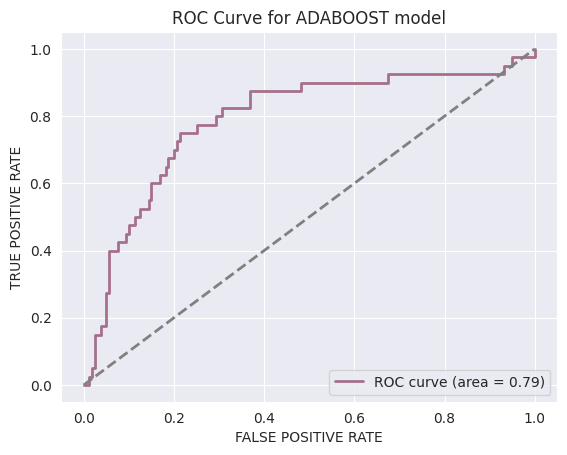

In [286]:
fpr, tpr, _ = roc_curve(y_test, adaboost_pred_proba)
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr, color='#a6708c', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlabel('FALSE POSITIVE RATE')
plt.ylabel('TRUE POSITIVE RATE')
plt.title('ROC Curve for ADABOOST model')
plt.legend(loc="lower right")
plt.show()

<h2>XGBOOST MODEL ↩️</h2>

In [287]:
from xgboost import XGBClassifier

In [288]:
xgb = XGBClassifier()

In [289]:
xgb.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [290]:
xgb_pred = xgb.predict(X_test)
xgb_pred

array([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1,
       0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0,
       1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1,
       0, 0])

In [292]:
print('ACCURACY SCORE : ', accuracy_score(y_test, xgb_pred))
print("Training accuracy: ", xgb.score(X_train, y_train))
print("Test accuracy : ", xgb.score(X_test, y_test))
print('ROC AUC SCORE : ', roc_auc_score(y_test, xgb_pred))
print('Cohen\'s Kappa Score :', cohen_kappa_score(y_test, xgb_pred))
print('\n\n \n---------Confusion Matrix--------------\n')
print(confusion_matrix(y_test, xgb_pred))
print('\n\n \n---------Classification Report--------------\n')
print(classification_report(y_test, xgb_pred))

ACCURACY SCORE :  0.805
Training accuracy:  1.0
Test accuracy :  0.805
ROC AUC SCORE :  0.728125
Cohen's Kappa Score : 0.42815249266862176


 
---------Confusion Matrix--------------

[[137  23]
 [ 16  24]]


 
---------Classification Report--------------

              precision    recall  f1-score   support

           0       0.90      0.86      0.88       160
           1       0.51      0.60      0.55        40

    accuracy                           0.81       200
   macro avg       0.70      0.73      0.71       200
weighted avg       0.82      0.81      0.81       200



In [293]:
xgb_score = cross_val_score(xgb,X,y,cv=5,scoring='accuracy')
print(xgb_score)
print()
print("cross validation score for XGB :",np.mean(xgb_score))

[0.815 0.79  0.79  0.82  0.86 ]

cross validation score for XGB : 0.8150000000000001


<Axes: >

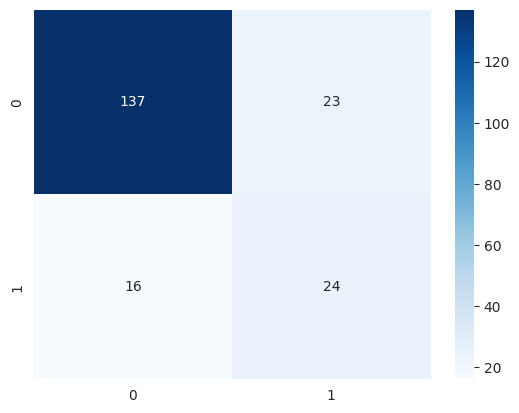

In [294]:
sns.heatmap(confusion_matrix(y_test,xgb_pred), annot=True, fmt='0.9g', cmap='Blues')

In [295]:
xgb_pred_proba = xgb.predict_proba(X_test)[:,1]
xgb_pred_proba

array([9.16634500e-01, 3.45325121e-03, 9.79070425e-01, 4.54543456e-02,
       2.80127730e-02, 2.16735546e-02, 3.84432438e-04, 8.76400387e-04,
       3.55926603e-02, 6.22397289e-03, 2.60268115e-02, 9.13414240e-01,
       5.52324772e-01, 3.62359267e-03, 7.67636001e-02, 5.45720994e-01,
       9.13622737e-01, 9.80647981e-01, 2.74892841e-02, 1.99665572e-03,
       2.94866823e-02, 8.28538597e-01, 3.53788957e-03, 7.23637990e-04,
       7.46574044e-01, 2.48937216e-03, 5.30412095e-03, 9.85851586e-01,
       6.52999501e-04, 3.01521318e-03, 5.95889578e-04, 9.52784896e-01,
       8.74206066e-01, 7.93573335e-02, 1.02188222e-01, 8.50446057e-03,
       9.69018321e-03, 1.31613851e-01, 6.64308220e-02, 9.54033554e-01,
       9.93794918e-01, 1.03621846e-02, 8.08722436e-01, 1.94893293e-02,
       9.55405552e-03, 1.59444883e-02, 6.07680418e-02, 5.65710943e-04,
       3.72713176e-03, 2.40233191e-03, 8.64708126e-01, 3.59063633e-02,
       6.52804226e-03, 6.23306073e-03, 4.32218015e-02, 4.92898468e-03,
      

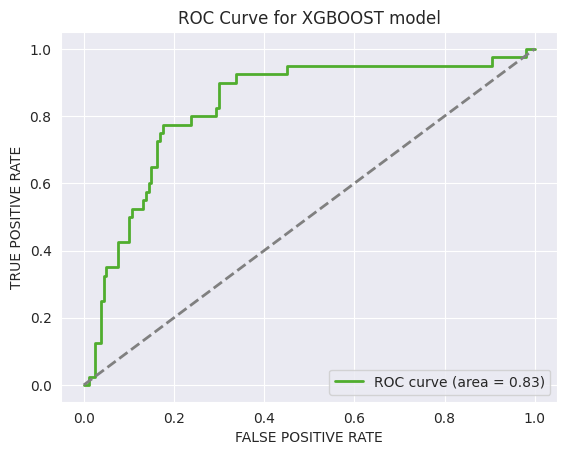

In [296]:
fpr, tpr, _ = roc_curve(y_test, xgb_pred_proba)
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr, color='#50ad2e', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlabel('FALSE POSITIVE RATE')
plt.ylabel('TRUE POSITIVE RATE')
plt.title('ROC Curve for XGBOOST model')
plt.legend(loc="lower right")
plt.show()

<h2>CATBOOST MODEL ↩️</h2>

In [298]:
from catboost import CatBoostClassifier

In [299]:
cat = CatBoostClassifier(verbose=False)

In [300]:
cat.fit(X_train, y_train)

In [301]:
cat_pred = cat.predict(X_test)
cat_pred

array([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1,
       0, 0])

In [302]:
print('ACCURACY SCORE : ', accuracy_score(y_test, cat_pred))
print("Training accuracy: ", cat.score(X_train, y_train))
print("Test accuracy : ", cat.score(X_test, y_test))
print('ROC AUC SCORE : ', roc_auc_score(y_test, cat_pred))
print("Cohen's Kappa Score :", cohen_kappa_score(y_test, cat_pred))
print('\n\n \n---------Confusion Matrix-------------------\n')
print(confusion_matrix(y_test, cat_pred))
print('\n\n \n---------Classification Report--------------\n')
print(classification_report(y_test, cat_pred))

ACCURACY SCORE :  0.81
Training accuracy:  0.9974704890387859
Test accuracy :  0.81
ROC AUC SCORE :  0.7218749999999999
Cohen's Kappa Score : 0.4277108433734941


 
---------Confusion Matrix-------------------

[[139  21]
 [ 17  23]]


 
---------Classification Report--------------

              precision    recall  f1-score   support

           0       0.89      0.87      0.88       160
           1       0.52      0.57      0.55        40

    accuracy                           0.81       200
   macro avg       0.71      0.72      0.71       200
weighted avg       0.82      0.81      0.81       200



In [315]:
cat_score = cross_val_score(cat,X,y,cv=5,scoring='accuracy')
print(cat_score)
print()
print("cross validation score for CatBoost Model :",np.mean(cat_score))

[0.815 0.785 0.77  0.84  0.855]

cross validation score for CatBoost Model : 0.813


<Axes: >

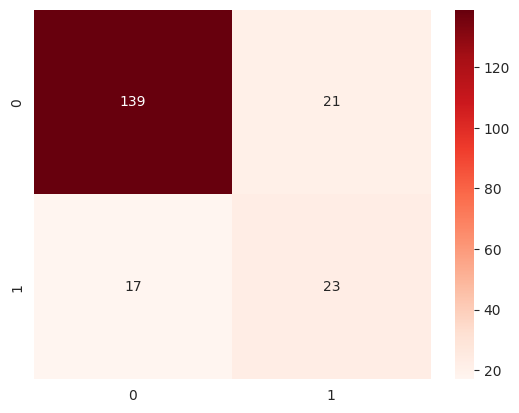

In [305]:
sns.heatmap(confusion_matrix(y_test,cat_pred), annot=True, fmt='0.9g', cmap='Reds')

In [321]:
cat_pred_proba = cat.predict_proba(X_test)[:,1]
cat_pred_proba

array([0.8368587 , 0.05307176, 0.87121355, 0.08588519, 0.24994161,
       0.19931947, 0.04413866, 0.0352004 , 0.16899002, 0.04703355,
       0.17855528, 0.77918655, 0.4925757 , 0.13755688, 0.2353484 ,
       0.51112871, 0.67635428, 0.92834143, 0.07015586, 0.03145044,
       0.29179375, 0.48014129, 0.05011646, 0.03748837, 0.77783382,
       0.05180902, 0.05676247, 0.94654503, 0.0315797 , 0.12025168,
       0.01507584, 0.80794388, 0.77456397, 0.14874425, 0.06157481,
       0.03146784, 0.02747109, 0.10841636, 0.19464641, 0.85025006,
       0.9541157 , 0.04240667, 0.46736302, 0.089589  , 0.07668753,
       0.12431947, 0.11497008, 0.01921758, 0.1309418 , 0.04602022,
       0.61124007, 0.15330978, 0.08800604, 0.07850587, 0.23218738,
       0.05996493, 0.17087474, 0.07699629, 0.74224019, 0.05943014,
       0.08260674, 0.17276172, 0.03266813, 0.05980082, 0.13047308,
       0.18848744, 0.0257786 , 0.08306298, 0.07199546, 0.03602312,
       0.05369582, 0.05119981, 0.03890789, 0.17709304, 0.02733

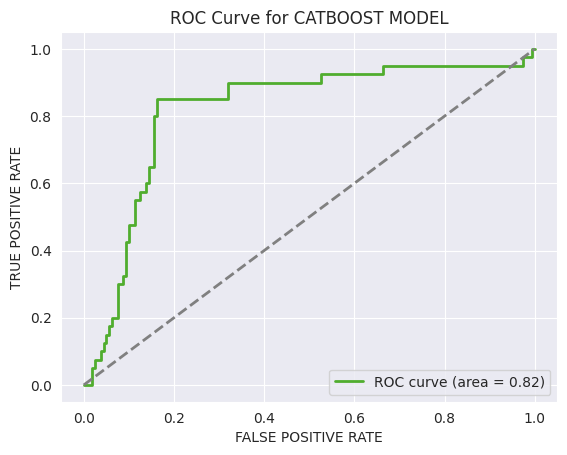

In [322]:
fpr, tpr, _ = roc_curve(y_test, cat_pred_proba)
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr, color='#50ad2e', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlabel('FALSE POSITIVE RATE')
plt.ylabel('TRUE POSITIVE RATE')
plt.title('ROC Curve for CATBOOST MODEL')
plt.legend(loc="lower right")
plt.show()

<h2>RIDGE CLASSIFIER ↩️</h2>

In [310]:
from sklearn.linear_model import RidgeClassifier

In [311]:
ridge = RidgeClassifier()

In [312]:
ridge.fit(X_train, y_train)

RidgeClassifier()

In [313]:
ridge_pred = ridge.predict(X_test)
ridge_pred

array([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1,
       0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1,
       0, 0])

In [314]:
print('ACCURACY SCORE : ', accuracy_score(y_test, ridge_pred))
print("Training accuracy: ",ridge.score(X_train,y_train))
print("Test accuracy : ",ridge.score(X_test,y_test))
print('ROC AUC SCORE : ', roc_auc_score(y_test, ridge_pred))
print('Cohen\'s Kappa Score :', cohen_kappa_score(y_test, ridge_pred))
print('\n\n \n---------Confusion Matrix--------------\n')
print(confusion_matrix(y_test,ridge_pred))
print('\n\n \n---------Classification Report--------------\n')
print(classification_report(y_test,ridge_pred))

ACCURACY SCORE :  0.815
Training accuracy:  0.9266441821247892
Test accuracy :  0.815
ROC AUC SCORE :  0.725
Cohen's Kappa Score : 0.43768996960486317


 
---------Confusion Matrix--------------

[[140  20]
 [ 17  23]]


 
---------Classification Report--------------

              precision    recall  f1-score   support

           0       0.89      0.88      0.88       160
           1       0.53      0.57      0.55        40

    accuracy                           0.81       200
   macro avg       0.71      0.72      0.72       200
weighted avg       0.82      0.81      0.82       200



In [316]:
ridge_score=cross_val_score(ridge,X,y,cv=5,scoring='accuracy')
print(ridge_score)
print()
print("cross validation score for RIDGE CLASSIFIER :",np.mean(ridge_score))

[0.83  0.82  0.835 0.86  0.875]

cross validation score for RIDGE CLASSIFIER : 0.844


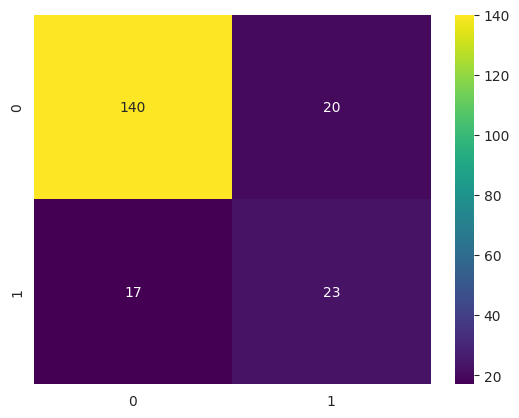

In [320]:
sns.heatmap(confusion_matrix(y_test, ridge_pred),fmt='0.9g', annot=True,cmap='viridis')
plt.show()

In [349]:
ridge_pred_proba = ridge.decision_function(X_test)
ridge_pred_proba

array([ 0.00362694, -0.71615832,  1.32346052, -0.77073517, -0.74684987,
       -0.61721801, -1.04824175, -1.20923104, -0.67879529, -0.7141563 ,
       -0.82805394,  0.47126692,  0.30529185, -0.57871077, -0.52108982,
       -0.25911155, -0.2109507 ,  0.48980818, -0.34717607, -1.1373739 ,
       -0.461016  ,  0.19654078, -1.21206988, -1.09601486,  0.24306015,
       -1.00129052, -0.71658631,  1.77938262, -0.56605784, -0.48308915,
       -1.42669918, -0.22481601,  0.65839751, -0.8957434 , -0.77040415,
       -0.79590038, -0.85618536, -1.0072209 , -0.40699017,  0.13951688,
        1.78945929, -0.15105058, -0.21997168, -0.70552244, -0.86012742,
       -0.90726424, -0.72516368, -0.64879117, -0.71977652, -0.97122422,
        0.11148514, -0.34001143, -0.65105182, -0.40761352, -0.20428716,
       -0.63063563, -0.36420631, -0.95608473,  0.39772973, -0.84743978,
       -0.19614389, -0.68664334, -1.28613066, -1.09074959, -0.52544733,
       -0.6782217 , -0.80301404, -0.89833721, -0.74191715, -0.80

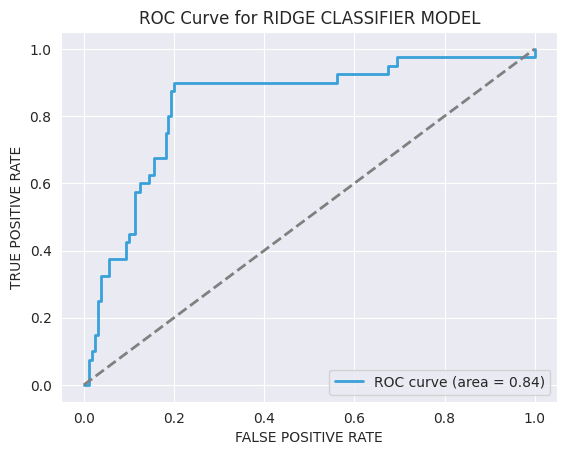

In [352]:
fpr, tpr, _ = roc_curve(y_test, ridge_pred_proba)
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr, color='#39a1d9', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlabel('FALSE POSITIVE RATE')
plt.ylabel('TRUE POSITIVE RATE')
plt.title('ROC Curve for RIDGE CLASSIFIER MODEL')
plt.legend(loc='lower right')
plt.show()

<HR>

<h2 style="color:#32ad92">MACHINE LEARNING MODELS EVALUATION⤵️</h2>

In [325]:
model_names = ['Logistic Regression', 'Decision Tree', 'Random Forest', 'SVM', 'KNN', 'ADABOOST', 'XGBOOST', 'CATBOOST', 'RIDGE']
models = [log_pred, dtc_pred, rfc_pred, svc_pred, knn_pred,adaboost_pred, xgb_pred, cat_pred, ridge_pred]
accscorelist = []
for x in models:
    print(accuracy_score(y_test, x))
    accscorelist.append(accuracy_score(y_test, x))
print(accscorelist)

0.82
0.78
0.76
0.825
0.225
0.8
0.805
0.81
0.815
[0.82, 0.78, 0.76, 0.825, 0.225, 0.8, 0.805, 0.81, 0.815]


In [326]:
data = pd.DataFrame({
    'Model': model_names,
    'Accuracy Score': accscorelist
})
data = data.sort_values(by='Accuracy Score', ascending=False)

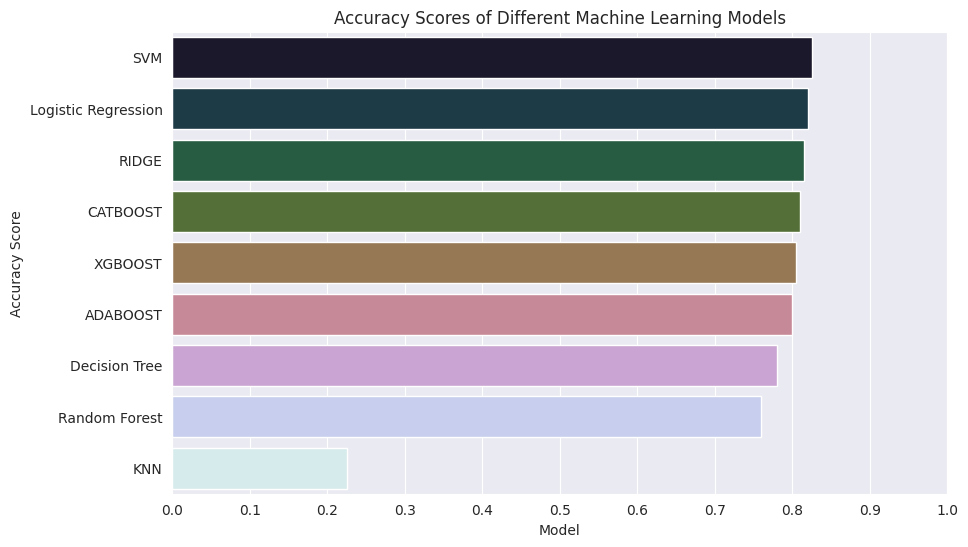

In [333]:
plt.figure(figsize=(10, 6))
sns.barplot(data=data, y='Model', x='Accuracy Score', palette='cubehelix')
plt.title('Accuracy Scores of Different Machine Learning Models')
plt.xlabel('Model')
plt.ylabel('Accuracy Score')
plt.xticks([0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0]) 
plt.show()

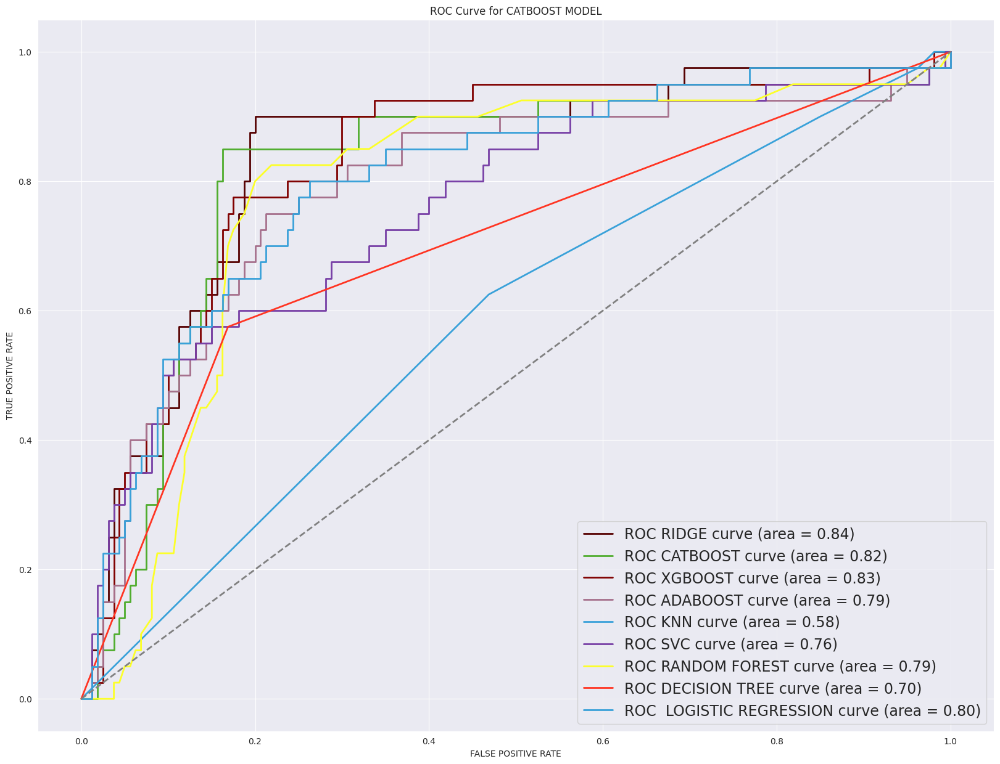

In [362]:
plt.figure(figsize=(20,15))
fpr, tpr, _ = roc_curve(y_test, ridge_pred_proba)
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr, color='#550000', lw=2, label='ROC RIDGE curve (area = %0.2f)' % roc_auc)
fpr, tpr, _ = roc_curve(y_test, cat_pred_proba)
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr, color='#50ad2e', lw=2, label='ROC CATBOOST curve (area = %0.2f)' % roc_auc)
fpr, tpr, _ = roc_curve(y_test, xgb_pred_proba)
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr, color='maroon', lw=2, label='ROC XGBOOST curve (area = %0.2f)' % roc_auc)
fpr, tpr, _ = roc_curve(y_test, adaboost_pred_proba)
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr, color='#a6708c', lw=2, label='ROC ADABOOST curve (area = %0.2f)' % roc_auc)
fpr, tpr, _ = roc_curve(y_test, knn_pred_proba)
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr, color='#39a1d9', lw=2, label='ROC KNN curve (area = %0.2f)' % roc_auc)
fpr, tpr, _ = roc_curve(y_test, svc_pred_proba)
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr, color='#7840a6', lw=2, label='ROC SVC curve (area = %0.2f)' % roc_auc)
fpr, tpr, _ = roc_curve(y_test, rfc_pred_proba)
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr, color='#fcff29', lw=2, label='ROC RANDOM FOREST curve (area = %0.2f)' % roc_auc)
fpr, tpr, _ = roc_curve(y_test, dtc_pred_proba)
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr, color='#ff3422', lw=2, label='ROC DECISION TREE curve (area = %0.2f)' % roc_auc)
fpr, tpr, _ = roc_curve(y_test, log_pred_proba)
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr, color='#39a1d9', lw=2, label='ROC  LOGISTIC REGRESSION curve (area = %0.2f)' % roc_auc)

plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlabel('FALSE POSITIVE RATE')
plt.ylabel('TRUE POSITIVE RATE')
plt.title('ROC Curve for CATBOOST MODEL')
plt.legend(loc='lower right',fontsize=17)
plt.show()

In [348]:
for x,y in zip(models,model_names):
    print(f'{y} ROC AUC SCORE IS {roc_auc_score(y_test, x)}')

Logistic Regression ROC AUC SCORE IS 0.709375
Decision Tree ROC AUC SCORE IS 0.703125
Random Forest ROC AUC SCORE IS 0.5593750000000001
SVM ROC AUC SCORE IS 0.609375
KNN ROC AUC SCORE IS 0.50625
ADABOOST ROC AUC SCORE IS 0.6875
XGBOOST ROC AUC SCORE IS 0.728125
CATBOOST ROC AUC SCORE IS 0.7218749999999999
RIDGE ROC AUC SCORE IS 0.725


<hr>

<p style="font-size:140%;color:#0c1fcc">➡️ Now, We have trained and tested all models and the best performing model is SUPPORT VECTOR MACHINE CLASSIFIER (SVC) which give 82% accuracy and 0.60 roc auc score but we will not select this model because if we consider other metrics as well, then CATBOOST, XGBOOST AND RIDGE CLASSIFIER have a three horse race and the difference in Acuuracy, ROC AUC SCORE AND Area Under Curve of these 3 models is almost negligible as you can see in the above graph and output above.</h2>
<p style="font-size:140%;color:#aa55ff">➡️ Now, we will select Ridge Classifier as it gives the best all round performance. It gives accuracy of almost 82% accurcy and roc auc score of 0.73 and area under the curve (AUC) is 0.84</p>
<p style="font-size:140%;color:#2badb4">➡️ No, we will try to hyperparameter tune our RIDGE CLASSIFIER model to see if we can improve even further.</p>

<hr>

<h2 style="color:#253e55">HYPERPARAMETER TUNING ⤵️</h2>

In [363]:
from sklearn.model_selection import GridSearchCV

In [369]:
param_grid = {
    'alpha': [0.1, 1, 10, 100, 150, 200, 250, 300],
    'solver': ['auto', 'svd', 'cholesky', 'lsqr', 'sparse_cg', 'sag', 'saga']
}

In [370]:
grid = GridSearchCV(ridge, param_grid=param_grid, scoring='accuracy',n_jobs=-1,cv=5,verbose=4)

In [371]:
grid.fit(X_train, y_train)

Fitting 5 folds for each of 56 candidates, totalling 280 fits


GridSearchCV(cv=5, estimator=RidgeClassifier(), n_jobs=-1,
             param_grid={'alpha': [0.1, 1, 10, 100, 150, 200, 250, 300],
                         'solver': ['auto', 'svd', 'cholesky', 'lsqr',
                                    'sparse_cg', 'sag', 'saga']},
             scoring='accuracy', verbose=4)

In [372]:
grid.best_score_

0.8517639967379358

In [373]:
grid.best_params_

{'alpha': 100, 'solver': 'lsqr'}

In [375]:
best_model = grid.best_estimator_

In [376]:
best_model.fit(X_train, y_train)

RidgeClassifier(alpha=100, solver='lsqr')

In [377]:
best_pred = best_model.predict(X_test)
best_pred

array([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1,
       0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1,
       0, 0])

In [378]:
print('ACCURACY SCORE : ', accuracy_score(y_test, best_pred))
print("Training accuracy: ",best_model.score(X_train,y_train))
print("Test accuracy : ",best_model.score(X_test,y_test))
print('ROC AUC SCORE : ', roc_auc_score(y_test, best_pred))
print(f"Cohen's Kappa Score : {cohen_kappa_score(y_test, best_pred)}")
print('\n\n \n---------Confusion Matrix-------------------\n')
print(confusion_matrix(y_test,best_pred))
print('\n\n \n---------Classification Report--------------\n')
print(classification_report(y_test,best_pred))

ACCURACY SCORE :  0.805
Training accuracy:  0.924114671163575
Test accuracy :  0.805
ROC AUC SCORE :  0.6906249999999999
Cohen's Kappa Score : 0.3848580441640379


 
---------Confusion Matrix-------------------

[[141  19]
 [ 20  20]]


 
---------Classification Report--------------

              precision    recall  f1-score   support

           0       0.88      0.88      0.88       160
           1       0.51      0.50      0.51        40

    accuracy                           0.81       200
   macro avg       0.69      0.69      0.69       200
weighted avg       0.80      0.81      0.80       200



<Axes: >

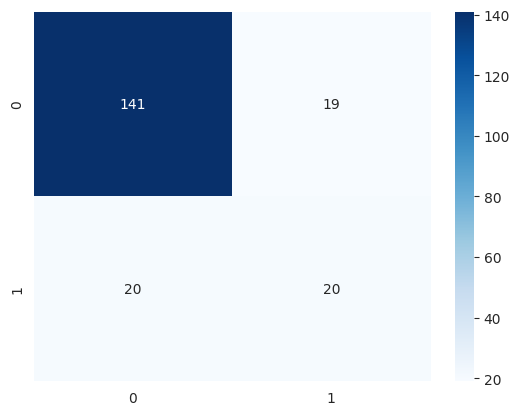

In [379]:
sns.heatmap(confusion_matrix(y_test, best_pred),fmt='0.9g',annot=True,cmap='Blues')

In [381]:
best_pred_proba = best_model.decision_function(X_test)
best_pred_proba

array([ 0.01712536, -0.82010143,  1.07006988, -0.64905584, -0.70535082,
       -0.44847325, -0.98999722, -1.06190894, -0.69087495, -0.66503218,
       -0.78139566,  0.36895581,  0.16921856, -0.4663359 , -0.41721276,
       -0.2987407 , -0.24403915,  0.40102384, -0.33918788, -0.95989974,
       -0.46195186,  0.09933391, -1.12809978, -1.00630351,  0.19640235,
       -0.96498753, -0.69559405,  1.49081244, -0.55413688, -0.39848286,
       -1.33535821, -0.27159679,  0.45772451, -0.77303748, -0.73366575,
       -0.82893375, -0.78350095, -0.94814131, -0.29557627,  0.11351731,
        1.60872864, -0.25110656, -0.36310678, -0.61482536, -0.79518197,
       -0.85481107, -0.63998619, -0.59856732, -0.71271117, -0.91491088,
        0.10817486, -0.29298899, -0.61440339, -0.44312818, -0.21440982,
       -0.52259716, -0.25458475, -0.82764602,  0.3807892 , -0.7515064 ,
       -0.22582412, -0.55428455, -1.13413038, -1.08024427, -0.57263673,
       -0.57353185, -0.7138023 , -0.93169936, -0.66346163, -0.75

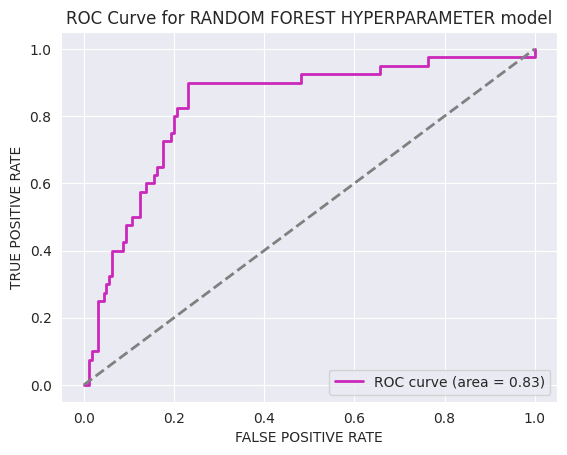

In [383]:
fpr, tpr, _ = roc_curve(y_test, best_pred_proba)
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr, color='#cb28bb', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlabel('FALSE POSITIVE RATE')
plt.ylabel('TRUE POSITIVE RATE')
plt.title('ROC Curve for RANDOM FOREST HYPERPARAMETER model')
plt.legend(loc="lower right")
plt.show()

<p style="font-size:140%;color:#aa007f">➡️ We can see that even after hypeparamter tuning techniques like GridSearchCV we cannot improve the RIDGE CLASSIFIER model accuracy and other metrics like roc auc score and AUC at all. The model after hyperparameter tuning gives 80% accuracy which is almost equal to 82% accuracy we were getting before. So, we will stop here and save the model using joblib library for further reference.</p>
<p style="font-size:140%;color:#ec7717">➡️ Finally, RIDGE CLASSIFIER model is the best performing model because it gives 82% accuracy, roc auc score of 0.73 and AUC of 0.84 which are the best paramters out of all the models we built.</p>
<hr>

<h2 style="color:#41a8ec">SAVING THE MODEL ⤵️</h2>

In [384]:
import joblib

In [385]:
joblib.dump(ridge, filename='Insurance_Fraud_Claim_Detection_Model.pkl')

['Insurance_Fraud_Claim_Detection_Model.pkl']

<h1>DOCUMENTATION ⤵️<h1>

<hr>
<p style="font-size:140%;color:#797979">We first imported the dataset using pandas dataframe, then even replaced all "?" values with NaN values as it was nothing and did some visual representation of the dataset, then cleaned the dataset by filling null values with most frequent values of the respective columns. Then, we did label encoding on fraud_reported column and one hot encoding on categorical columns like <u>policy_state, policy_csl, insured_sex, insured_education_level, insured_occupation, insured_hobbies, insured_relationship, incident_type, collision_type, incident_severity, authorities_contacted, incident_state, incident_city, property_damage, police_report_available and auto_make</u>.</p>
<br>
<p style="font-size:140%;color:#797979">We built many histograms, kdeplots, boxplots, violinplots, pie charts of all the numerical columns in the dataset. The, using seaborn library we built the co-relation heatmap between all the columns. Then, some stripplots were plotted to gain more information regarding the dataset. Also, barplots containing mean or average value of some numerical column like policy premium, insurance_claim_amount were built with respect to almost important categorical columns with the help of groupby dataframe method. Then, crosstabs were used to plot many countplots for additional information.</p>
<br>
<p style="font-size:140%;color:#797979">The column umbrella_limit contained skewness of 1.8 which was not good so we solved this problem with the help of <U>POWER TRANSFORMER YEO-JOHNSON</U> method. Also, SMOTE(SYNTHETIC MINORITY OVERSAMPLING technique) was used for handling imbalanced data. Then, we split the data into training and testing data and then scaled the data using Standard Scaler.</p>
<br><hr>
<p style="font-size:140%;color:#797979">We then trained multiple models and tested them and the results are given below.</p>
<br>
<p style="font-size:140%;color:#797979">The model chosen for this task is a supervised learning model suitable for binary classification tasks. The following models were evaluated ⤵️</p>

<p style="font-size:120%;color:#797979">
    <ul style="font-size:140%;color:#797979">
        <li>Logistic Regression</li>
        <li>Decision Tree</li>
        <li>Random Forest</li>
        <li>SVM</li>
        <li>KNN</li>
        <li>ADABOOST</li>
        <li>XGBOOST</li>
        <li>CatBoosting</li>
        <li>RIDGE CLASSIFIER</li>
    </ul>
</p>
<hr>
<p style="font-size:140%;color:#797979">The selected model RIDGE CLASSIFIER was trained using a training dataset split from the original dataset. Cross-validation was used to tune hyperparameters to optimize performance metrics such as accuracy, precision, recall, and F1-score.
</p>

<p style="font-size:140%;color:#797979">RIDGE CLASSIFIER MODEL RESULTS ⤵️ </p>

<pre style="font-size:140%;color:#797979">⚫ Accuracy : 0.815 or 82%

⚫ Precision :
    ➡️ Macro : 0.71
    ➡️ Weighted : 0.82
    
⚫ Recall : 
    ➡️ Macro : 0.72
    ➡️ Weighted : 0.81
    
⚫ F1-score :
    ➡️ Macro : 0.72
    ➡️ Weighted : 0.82
    
⚫ ROC AUC : 0.725

⚫ AUC(Area Under Curve) : 0.84
</pre>
<hr>

<p style="font-size:140%;color:#797979">The model created is a very robust and up to date model which is able to predict whether the insurance claim made by an individual is fraudulent or not based on the policy details, incident information and the car information and many other factors.</p>
<hr>